#### Dependencies

In [2]:
from google.colab import drive
drive.mount("/content/drive")
import os
path_base="/content/drive/MyDrive/Capstone/"
path_LSTM ="/content/drive/MyDrive/Capstone/Model/BayesLSTM/"
output_path = '/content/drive/MyDrive/Capstone/Model/BayesLSTM/output/'
result_path = '/content/drive/MyDrive/Capstone/Model/BayesLSTM/result/'
os.chdir(path_base)
os.chdir(path_LSTM)
os.chdir(output_path)
os.chdir(result_path)

Mounted at /content/drive


In [3]:
%cd /content/drive/MyDrive/Capstone/Model/BayesLSTM
from Helpers import *
from LSTM_Helpers import *
from BayesLSTM_Helpers import *

/content/drive/MyDrive/Capstone/Model/BayesLSTM


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
NumExpr defaulting to 2 threads.


#### Data

- use `rolling_statistics` as the imputation method

- if target data not up to 2021, use `InterpolatedUnivariateSpline` to interpolate

In [4]:
path="/content/drive/MyDrive/Capstone/Data/cleaned/"
os.chdir(path)
Data_dic_m = pd.ExcelFile('Manufacturing_filled.xlsx')
Data_dic_s = pd.ExcelFile('Service_filled.xlsx')

In [5]:
from scipy import interpolate

m_dfs = {}
for sheet in dic_country.keys():
    df = pd.read_excel(Data_dic_m, sheet_name=sheet)
    df['Year'] = [i.year for i in pd.to_datetime(df.Year, format='%Y')]
    df = df.set_index('Year')
    tmp_year = pd.DataFrame({'Year': [i for i in range(df.index[0], 2022)]})
    tmp_year['Year'] = [i.year for i in pd.to_datetime(tmp_year.Year, format='%Y')]
    df1 = df.join(tmp_year.set_index('Year'), on = 'Year', how = 'right')
    if 'Year' in df1.columns:
      df1 = df1.set_index('Year')
    tmp = {}
    for col in df.columns:
      s = interpolate.InterpolatedUnivariateSpline(x=df.index, y=df[col])
      ynew = s(df1.index)
      tmp[col] = ynew
    final_df = pd.DataFrame(tmp)
    final_df.index = df1.index
    m_dfs[sheet] = final_df

In [6]:
from scipy import interpolate

s_dfs = {}
for sheet in dic_country.keys():
    df = pd.read_excel(Data_dic_s, sheet_name=sheet)
    df['Year'] = [i.year for i in pd.to_datetime(df.Year, format='%Y')]
    df = df.set_index('Year')
    tmp_year = pd.DataFrame({'Year': [i for i in range(df.index[0], 2022)]})
    tmp_year['Year'] = [i.year for i in pd.to_datetime(tmp_year.Year, format='%Y')]
    df1 = df.join(tmp_year.set_index('Year'), on = 'Year', how = 'right')
    if 'Year' in df1.columns:
      df1 = df1.set_index('Year')
    tmp = {}
    for col in df.columns:
      s = interpolate.InterpolatedUnivariateSpline(x=df.index, y=df[col])
      ynew = s(df1.index)
      tmp[col] = ynew
    final_df = pd.DataFrame(tmp)
    final_df.index = df1.index
    s_dfs[sheet] = final_df

#### Pipeline

###### Hypers

In [7]:
SHIFT = 5
LW = 5
IW = 4
MAX_EPOCHS = 200
bs = 8
verbose = True
lr = 0.001
patience = 100

In [8]:
cmap = sns.color_palette('muted', 6).as_hex()[:]
cmap.append('#17becf')
sns.set_style("whitegrid")

In [9]:
cmap2_base = sns.color_palette('Blues_r', 6).as_hex()[:]
cmap2 = [cmap2_base[2], cmap2_base[3], cmap2_base[4], 'red']

###### Model blitz

In [10]:
 class NN(nn.Module):
    def __init__(self, args):
        super(NN, self).__init__()
        self.lstm_1 = blitz.modules.BayesianLSTM(args.n_features, 10, prior_sigma_1=args.prior_sigma_1, 
                                                 prior_pi=args.prior_pi1, posterior_rho_init=args.posterior_rho_init1)
        self.lstm_2 = blitz.modules.BayesianLSTM(10, 256, prior_sigma_1=args.prior_sigma_2, 
                                                 prior_pi=args.prior_pi2, posterior_rho_init=args.posterior_rho_init2)
        self.lstm_3 = blitz.modules.BayesianLSTM(256, 128, prior_sigma_1=args.prior_sigma_3, 
                                                 prior_pi=args.prior_pi3, posterior_rho_init=args.posterior_rho_init3)
        self.rnn_test = nn.RNN(128, 10, 2)
        self.linear = nn.Linear(10, 5)
            
    def forward(self, x):
        x_, x_1 = self.lstm_1(x)
        x_, x_2 = self.lstm_2(x_)
        x_, x_3 = self.lstm_3(x_)
        x_, x_4 = self.rnn_test(x_)
        
        #gathering only the latent end-of-sequence for the linear layer
        x_ = x_[:, -1, :]
        x_ = self.linear(x_)
        return x_

    def compute_loss(self, y_hat, y):
      return nn.L1Loss()(y_hat, y.float())

In [11]:
# define an attribute dictionary class, used to save attributes
class AttrDict(dict):
    def __init__(self, *args, **kwargs):
        super(AttrDict, self).__init__(*args, **kwargs)
        self.__dict__ = self

###### Evaludate

In [12]:
def evaluate_regression(preds,
                        std_multiplier = 2):
    preds = np.stack(preds)
    means = preds.mean(axis=0)
    stds = preds.std(axis=0)
    ci_upper = means + (std_multiplier * stds)
    ci_lower = means - (std_multiplier * stds)
    return means, ci_upper, ci_lower

In [54]:
def fetch_all(model, wg, scaled_data,  args, samples=100):    
    losses = []    
    with torch.no_grad():
      X =  next(iter(wg.all_data))[0].numpy()
      y =  next(iter(wg.all_data))[1].numpy()
      if args.gpu: # if gpu
          X = torch.from_numpy(X).cuda() # convert data to gpu
          y = torch.from_numpy(y).cuda() # convert target to gpu
      preds = []
      for i in range(samples):
        y_pred = model(X.float())
        med, qrg = rbscaler.get_fitted()
        target_median, qrange = med.values[-1], qrg[-1]
        y_pred = y_pred.cpu().detach().numpy()*qrange+target_median
        y_real = np.array([y*qrange+target_median for y in y.cpu().detach().numpy()]).reshape(y_pred.shape)
        preds.append(y_pred)
      means, ci_upper, ci_lower = evaluate_regression(preds)
      df_1 = pd.DataFrame({
               'Year':  scaled_data.index[IW+LW-1:],
               'y_value': means[:, -1], 
               'y_lower_bound': ci_lower[:, -1], 
               'y_upper_bound': ci_upper[:, -1], 
               })
      ax = pd.DataFrame({'y_value': means[:, -1], 
                  'y_lower_bound': ci_lower[:, -1], 
               'y_upper_bound': ci_upper[:, -1], 
              'y_real': y_real[:, -1]
               },
              index =  scaled_data.index[IW+LW-1:]).plot(title = f'{ckey}: MAE = {round(MAE(means, y_real)[0][-1], 4)}', color = cmap2)
      ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}-CI', bbox_inches='tight')
      mae = str(MAE(means, y_real)[0][-1])
      rmse = str(RMSE(means, y_real)[0][-1])
      mape = str(MAPE(means, y_real)[0])
      preds = []
      for i in range(samples):
        df_2 = forecast(rbscaler, scaled_data, model, name = 'y_value',IW=4, args=args)
        y_pred = df_2.values
        preds.append(y_pred)
      means, ci_upper, ci_lower = evaluate_regression(preds)

      df_2 = pd.DataFrame({
               'Year':  df_2.index,
               'y_value': means[:, -1], 
               'y_lower_bound': ci_lower[:, -1], 
               'y_upper_bound': ci_upper[:, -1], 
               })
      return df_1, df_2, mae, rmse, mape

###### Write Data

In [14]:
def write_data():
  logs = {}
  logs['y_fitted_on_begin_2016'] = df_1
  logs['y_pred_on_2017_2021'] = df_2
  logs['y_fitted_on_begin_2021'] = df_3
  logs['y_pred_on_2022_2026'] = df_4
  with pd.ExcelWriter(path_LSTM + args.experiment_name  + "/result/" + f'{target_type}/{ckey}.xlsx') as writer:
    for log_type, log in logs.items():
      log.to_excel(writer, sheet_name=log_type, index = False)

### Model


##### 1-Manufacturing

In [55]:
target_type = 'Manufacturing'

###### Multivariate

In [56]:
model_type = 'Multivariate'

===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2968, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3717,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.2655, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3439,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2388, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3790,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3068, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3345,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2835, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4261,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2451, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4158,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2323, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3889,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2499, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3951,  Validation time (s): 0
===== Evaluation =====
MAE [5.1140494, 3.1986086, 4.111485, 4.1546335, 4.4494305]  Mean MAE 4.2056417 
RMSE [5.203179, 3.317664, 4.207811, 4.2952194, 4.557829] Mean RMSE 4.359091 
MA

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3456, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3597,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3374, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2940,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3554, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4088,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3497, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3878,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3368, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3268,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3472, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3425,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3560, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3988,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3492, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3352,  Validation time (s): 0
===== Evaluation =====
MAE [3.5805912, 2.2988265, 4.5927463, 2.401014, 5.1329517]  Mean MAE 3.6012259 
RMSE [3.6338518, 2.341335, 4.6897926, 2.4333313, 5.3307047] Mean RMSE 3.8734584 
MAPE [0.5605126, 0.37317017, 0.77414125, 0.4095794, 0

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3981, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.1981,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3684, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2276,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3840, Training Time (s): 0
Epoch [3/8], Val Loss: 0.1851,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3939, Training Time (s): 0
Epoch [4/8], Val Loss: 0.1776,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3524, Training Time (s): 0
Epoch [5/8], Val Loss: 0.1964,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3611, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1966,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3914, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2103,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3588, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2164,  Validation time (s): 0
===== Evaluation =====
MAE [2.6475341, 4.578437, 2.334383, 7.3427796, 6.909157]  Mean MAE 4.7624583 
RMSE [3.3501618, 5.487226, 3.0987132, 8.053359, 8.097687] Mean RMSE 6.022697 
MAP

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3881, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2988,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3841, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2697,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3909, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2653,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3648, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2715,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3857, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2766,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3675, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2572,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3667, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3098,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3815, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2619,  Validation time (s): 0
===== Evaluation =====
MAE [3.2272613, 5.883242, 4.7862525, 6.9517074, 12.096353]  Mean MAE 6.5889635 
RMSE [3.914945, 6.3429704, 5.3913355, 7.0261703, 12.299324] Mean RMSE 7.5533705

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4361, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2334,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3847, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2493,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4275, Training Time (s): 0
Epoch [3/8], Val Loss: 0.1905,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4087, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2774,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3753, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2314,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3855, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2267,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3833, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2560,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4123, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2558,  Validation time (s): 0
===== Evaluation =====
MAE [1.3317114, 2.655275, 0.9157856, 3.2379649, 1.0630536]  Mean MAE 1.8407581 
RMSE [1.4462556, 2.7162225, 1.1412545, 3.5718362, 1.3018967] Mean RMSE 2.2461045 
MAPE [0.1360721, 0.27343744, 0.1036618, 0.38043532, 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4679, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.1556,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4778, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2486,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5512, Training Time (s): 0
Epoch [3/8], Val Loss: 0.1772,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4649, Training Time (s): 0
Epoch [4/8], Val Loss: 0.1668,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4647, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2228,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5089, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1812,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4645, Training Time (s): 0
Epoch [7/8], Val Loss: 0.1717,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4946, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1779,  Validation time (s): 0
===== Evaluation =====
MAE [0.8548328, 0.9838392, 0.697941, 2.0896208, 2.4858906]  Mean MAE 1.4224248 
RMSE [1.2158313, 1.1943145, 0.8669827, 2.304054, 2.758559] Mean RMSE 1.8206924 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([2, 5, 1])) that is different to the input size (torch.Size([10])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.1779, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3569,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([4, 5, 1])) that is different to the input size (torch.Size([20])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.2431, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3369,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.1679, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3800,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2424, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3196,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2412, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2443,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2005, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3100,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3000, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2598,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3351, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3946,  Validation time (s): 0
===== Evaluation =====
MAE [2.9982588, 3.1694305, 1.7097155, 4.6770678, 3.4300497]  Mean MAE 3.1969042 
RMSE [3.3060799, 3.6514077, 1.9364388, 4.798458, 3.628051] Mean RMSE 3.583314 
MAPE [0.10306159, 0.11132463, 0.06144474, 0.17009771, 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([2, 5, 1])) that is different to the input size (torch.Size([10])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.1284, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([4, 5, 1])) that is different to the input size (torch.Size([20])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3113,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.1533, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2580,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.1520, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2798,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.1492, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2795,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.1599, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3040,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.1749, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2738,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.1687, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2972,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.1720, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2341,  Validation time (s): 0
===== Evaluation =====
MAE [1.5710558, 3.071338, 2.4233818, 4.1575065, 4.540527]  Mean MAE 3.152762 
RMSE [2.0300903, 3.3447013, 2.7850704, 4.4274817, 4.7092977] Mean RMSE 3.6012492 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4284, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2174,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4361, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2607,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4008, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2579,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3988, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2476,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4061, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2608,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4267, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2235,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3999, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3043,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3849, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2462,  Validation time (s): 0
===== Evaluation =====
MAE [0.4918014, 3.439845, 1.2904397, 1.8598627, 1.5722736]  Mean MAE 1.7308446 
RMSE [0.58277136, 3.8333733, 1.3418354, 2.023464, 1.8586053] Mean RMSE 2.2083347 
MAPE [0.053527717, 0.37553266, 0.14265482, 0.2069772

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4137, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2600,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3775, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2682,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3821, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2119,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3853, Training Time (s): 0
Epoch [4/8], Val Loss: 0.1900,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3521, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2304,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3669, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2516,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3851, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2504,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3700, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2697,  Validation time (s): 0
===== Evaluation =====
MAE [1.5453577, 0.8968034, 2.6988833, 0.6477501, 2.389234]  Mean MAE 1.6356056 
RMSE [1.9402845, 1.0148237, 2.8767586, 0.82508296, 2.5335205] Mean RMSE 2.00847

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4273, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.5067,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4145, Training Time (s): 0
Epoch [2/8], Val Loss: 0.5195,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4216, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5105,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4148, Training Time (s): 0
Epoch [4/8], Val Loss: 0.5028,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4205, Training Time (s): 0
Epoch [5/8], Val Loss: 0.5008,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4252, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5143,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4151, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4866,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4139, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4921,  Validation time (s): 0
===== Evaluation =====
MAE [0.8603799, 0.8488113, 1.1262757, 1.7947372, 1.8696376]  Mean MAE 1.2999685 
RMSE [0.9590325, 0.899967, 1.323431, 1.9276189, 1.9841359] Mean RMSE 1.4922241

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4082, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.5099,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4086, Training Time (s): 0
Epoch [2/8], Val Loss: 0.5023,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4073, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5560,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4117, Training Time (s): 0
Epoch [4/8], Val Loss: 0.5159,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4031, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4976,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3958, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4999,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3946, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4951,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3921, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5143,  Validation time (s): 0
===== Evaluation =====
MAE [0.6426285, 0.9027721, 1.3370304, 1.3960932, 1.4778004]  Mean MAE 1.1512648 
RMSE [0.72212607, 0.92692363, 1.494214, 1.589581, 1.6384699] Mean RMSE 1.32850

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3368, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.4755,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3401, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4302,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3648, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3450,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3577, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3662,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3492, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3972,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3405, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3977,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3357, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3870,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3191, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3841,  Validation time (s): 0
===== Evaluation =====
MAE [1.3173634, 0.9997657, 0.68240803, 0.31418166, 0.93712234]  Mean MAE 0.8501682 
RMSE [1.4829164, 1.104367, 0.78305835, 0.41177505, 1.0862207] Mean RMSE 1.0

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2928, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.5493,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.2858, Training Time (s): 0
Epoch [2/8], Val Loss: 0.5516,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3000, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5665,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2635, Training Time (s): 0
Epoch [4/8], Val Loss: 0.5674,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2766, Training Time (s): 0
Epoch [5/8], Val Loss: 0.5355,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2829, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5236,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2877, Training Time (s): 0
Epoch [7/8], Val Loss: 0.5625,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2743, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5582,  Validation time (s): 0
===== Evaluation =====
MAE [1.1138277, 1.7850758, 1.0838181, 1.4597803, 1.0995111]  Mean MAE 1.3084025 
RMSE [1.229865, 1.8452328, 1.1686984, 1.4959701, 1.1936281] Mean RMSE 1.410388

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.76512146, MAE2: 0.90291166
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4191, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.6476,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4064, Training Time (s): 0
Epoch [2/8], Val Loss: 0.6534,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4058, Training Time (s): 0
Epoch [3/8], Val Loss: 0.6412,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3887, Training Time (s): 0
Epoch [4/8], Val Loss: 0.6840,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3551, Training Time (s): 0
Epoch [5/8], Val Loss: 0.6987,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3863, Training Time (s): 0
Epoch [6/8], Val Loss: 0.6827,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3273, Training Time (s): 0
Epoch [7/8], Val Loss: 0.7206,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3302, Training Time (s): 0
Epoch [8/8], Val Loss: 0.6995,  Validation time (s): 0
===== Evaluation =====
MAE [4.5708385, 3.5443583, 3.5553396, 5.331589, 4.4008913]  Mean MAE 4.2806034 
RMSE [4.5906034, 3.627773, 3.7126215, 5.525642, 4.496297] Mean RMSE 4.4444876 


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4039, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.6559,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3903, Training Time (s): 0
Epoch [2/8], Val Loss: 0.6731,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4023, Training Time (s): 0
Epoch [3/8], Val Loss: 0.6271,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3731, Training Time (s): 0
Epoch [4/8], Val Loss: 0.6447,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3781, Training Time (s): 0
Epoch [5/8], Val Loss: 0.6655,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3588, Training Time (s): 0
Epoch [6/8], Val Loss: 0.6444,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3608, Training Time (s): 0
Epoch [7/8], Val Loss: 0.6747,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3409, Training Time (s): 0
Epoch [8/8], Val Loss: 0.6409,  Validation time (s): 0
===== Evaluation =====
MAE [4.137463, 6.4329925, 2.7135327, 4.5086484, 4.163564]  Mean MAE 4.3912406 
RMSE [4.3805566, 6.4683, 2.9892755, 4.570081, 4.426886] Mean RMSE 4.6999345 
MAP

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 3.0324967, MAE2: 2.5788743
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3986, Training Time (s): 0
Epoch [1/8], Val Loss: 0.1672,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3715, Training Time (s): 0
Epoch [2/8], Val Loss: 0.1580,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3672, Training Time (s): 0
Epoch [3/8], Val Loss: 0.1634,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3689, Training Time (s): 0
Epoch [4/8], Val Loss: 0.1653,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3460, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2217,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3330, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1721,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3401, Training Time (s): 0
Epoch [7/8], Val Loss: 0.1810,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3587, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1471,  Validation time (s): 0
===== Evaluation =====
MAE [0.7034909, 0.6048808, 0.78131914, 0.773639, 0.9721487]  Mean MAE 0.7670957 
RMSE [0.8190871, 0.65275

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4379, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3093,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4272, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2129,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4204, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2669,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4195, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2913,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4015, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2891,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4469, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2613,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4054, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2439,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4035, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2602,  Validation time (s): 0
===== Evaluation =====
MAE [1.1715959, 0.63164616, 0.66884327, 0.2446769, 1.309185]  Mean MAE 0.80518943 
RMSE [1.3608199, 0.71775883, 0.7174171, 0.3549566, 1.5005493] Mean RMSE 1.02

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.6351722, MAE2: 0.94213474


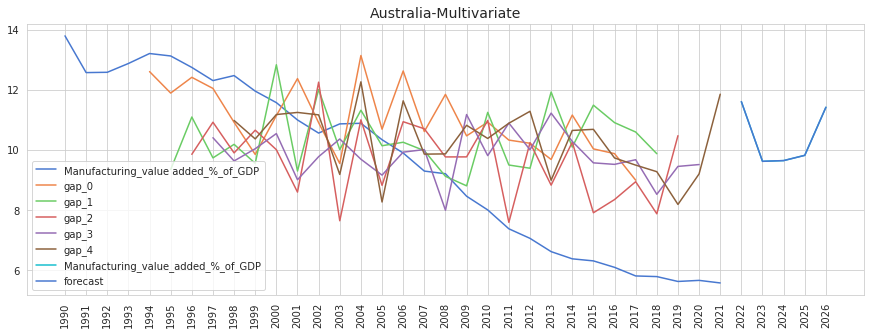

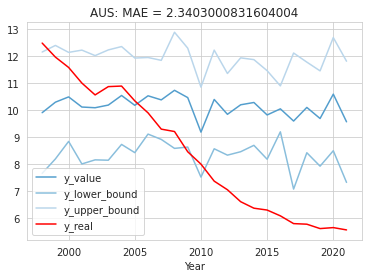

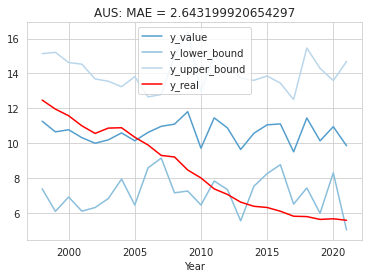

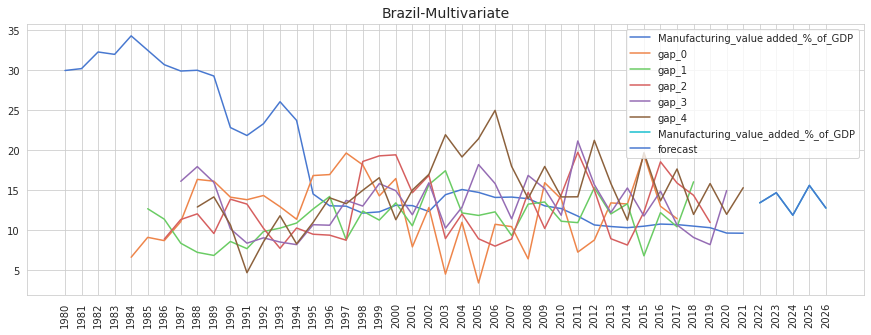

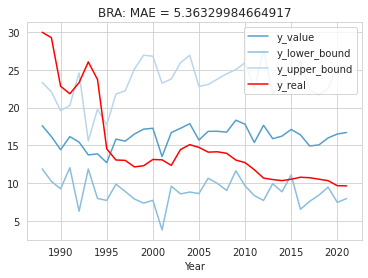

...

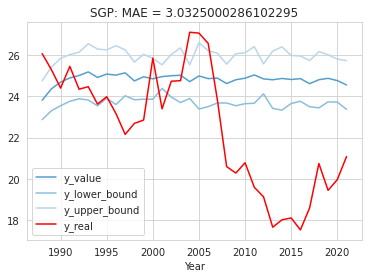

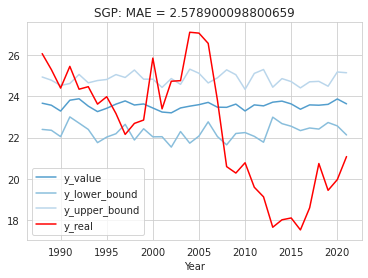

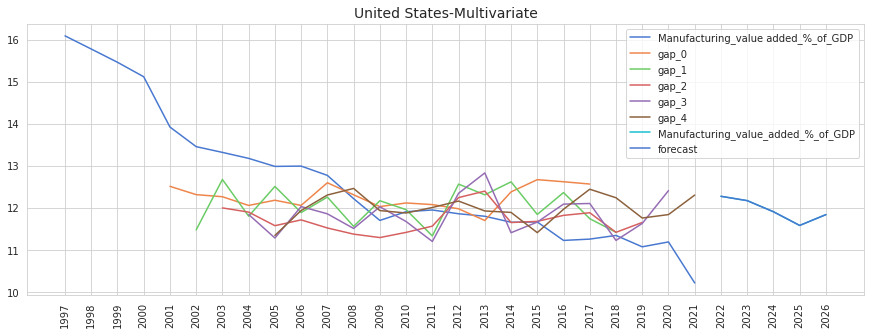

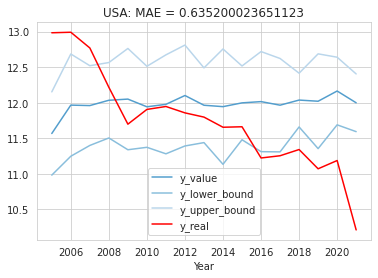

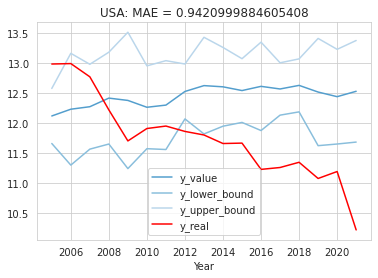

In [57]:
MAEs, RMSEs, MAPEs = [], [], []

for ckey in m_dfs.keys():
  country = dic_country[ckey]
  data = m_dfs[ckey]
  rbscaler = MRobustScaler() 
  scaled_data = rbscaler.transform(data, 0.1)
  train_df, val_df, test_df=train_test_split(scaled_data, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data,
                      label_columns=[scaled_data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.7,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)

  fcst = forecast(rbscaler, scaled_data, model, args, IW=IW, name = 'Manufacturing_value_added_%_of_GDP')
  fcst['forecast'] = fcst['Manufacturing_value_added_%_of_GDP']
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

###### Univariate

In [58]:
model_type = 'Univariate'

===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4627, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2312,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4283, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2578,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4204, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3455,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3832, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2793,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4566, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2406,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4239, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2916,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3869, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3143,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3774, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2718,  Validation time (s): 0
===== Evaluation =====
MAE [2.8745377, 1.4968683, 2.3920543, 4.626569, 3.6408145]  Mean MAE 3.0061688 
RMSE [3.1207092, 1.9381014, 2.4615624, 4.8135505, 3.6762393] Mean RMSE 3.3537848 
MAPE [0.46151254, 0.2343561, 0.39731464, 0.798284, 0

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2129, Training Time (s): 0
Epoch [1/8], Val Loss: 0.6243,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.2485, Training Time (s): 0
Epoch [2/8], Val Loss: 0.5610,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2600, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5490,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2256, Training Time (s): 0
Epoch [4/8], Val Loss: 0.5946,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2425, Training Time (s): 0
Epoch [5/8], Val Loss: 0.5525,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2280, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5365,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2984, Training Time (s): 0
Epoch [7/8], Val Loss: 0.5391,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2475, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5058,  Validation time (s): 0
===== Evaluation =====
MAE [4.3012724, 6.51576, 4.3731527, 5.0167055, 4.9761987]  Mean MAE 5.036618 
RMSE [4.307877, 6.526282, 4.439818, 5.0399404, 4.981974] Mean RMSE 5.1202197 
MAPE [0.67808694, 1.0637469, 0.7353301, 0.8578033, 0.86735

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3999, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2756,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4319, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2462,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4115, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2452,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4166, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3568,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4131, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2572,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4199, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2971,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4032, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2719,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3876, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1888,  Validation time (s): 0
===== Evaluation =====
MAE [10.780705, 2.6080163, 1.6918564, 12.648075, 0.5512026]  Mean MAE 5.6559706 
RMSE [10.799058, 2.630667, 1.8552737, 12.709906, 0.58255506] Mean RMSE 7.60083

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4092, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.1852,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3817, Training Time (s): 0
Epoch [2/8], Val Loss: 0.1743,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3733, Training Time (s): 0
Epoch [3/8], Val Loss: 0.1900,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3835, Training Time (s): 0
Epoch [4/8], Val Loss: 0.1969,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4252, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2082,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3790, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1658,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3849, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2212,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3927, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1623,  Validation time (s): 0
===== Evaluation =====
MAE [3.7567046, 9.322021, 2.9612606, 3.7295923, 3.3381348]  Mean MAE 4.6215425 
RMSE [3.7938256, 9.39382, 3.0037794, 4.0946827, 3.4130857] Mean RMSE 5.2929244 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4357, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.1940,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4418, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2281,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3547, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2202,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4479, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2413,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3890, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3332,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4020, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3717,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4248, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3394,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4180, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2789,  Validation time (s): 0
===== Evaluation =====
MAE [1.1619648, 1.4042827, 2.8049443, 1.5518717, 5.589009]  Mean MAE 2.5024145 
RMSE [1.1800973, 1.522741, 2.9449568, 1.8916616, 5.853327] Mean RMSE 3.1693518 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5287, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2733,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.5390, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2139,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5562, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2227,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5026, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2199,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4581, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2422,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5147, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2382,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4593, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2081,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4950, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2077,  Validation time (s): 0
===== Evaluation =====
MAE [1.1843458, 0.6828701, 1.0153574, 1.3327899, 2.8751996]  Mean MAE 1.4181125 
RMSE [1.1994475, 0.81165

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([2, 5, 1])) that is different to the input size (torch.Size([10])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([4, 5, 1])) that is different to the input size (torch.Size([20])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.1568, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2084,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.1680, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2148,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.1753, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2227,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.1672, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2842,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.1322, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2382,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.1305, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2470,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.1289, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2241,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.1763, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2504,  Validation time (s): 0
===== Evaluation =====
MAE [1.3168125, 3.6328146, 3.0826073, 4.142929, 4.5069737]  Mean MAE 3.3364275 
RMSE [1.6237643, 3.812932

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([2, 5, 1])) that is different to the input size (torch.Size([10])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([4, 5, 1])) that is different to the input size (torch.Size([20])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3017,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.1717, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3243,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3007, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3024,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3189, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3033,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2388, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3138,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2398, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2827,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.1585, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2827,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2360, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3797,  Validation time (s): 0
===== Evaluation =====
MAE [1.3723316, 2.1815376, 3.6184165, 4.046572, 3.8307755]  Mean MAE 3.0099263 
RMSE [1.6901213, 2.523881, 3.7764266, 4.1442585, 3.9029584] Mean RMSE 3.3435266

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5484, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3214,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4678, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2432,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4548, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3098,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5174, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3204,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4869, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3038,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4735, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2685,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4495, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3064,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4815, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2920,  Validation time (s): 0
===== Evaluation =====
MAE [0.48331308, 1.7269515, 2.3831375, 1.4781021, 3.1915596]  Mean MAE 1.8526129 
RMSE [0.70385575, 1.7701889, 2.4409902, 1.6244237, 3.208962] Mean RMSE 2.122433 
MAPE [0.052104022, 0.18967593, 0.26280236, 0.166701

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3637, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2127,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3817, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2560,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3975, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2822,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3989, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2648,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4118, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2929,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3576, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2741,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4069, Training Time (s): 0
Epoch [7/8], Val Loss: 0.1945,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4106, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2834,  Validation time (s): 0
===== Evaluation =====
MAE [3.1933658, 1.7254094, 1.8879508, 2.8781738, 0.45873132]  Mean MAE 2.028726 
RMSE [3.1999893, 1.7427696, 1.9750148, 2.9211814, 0.48271802] Mean RMSE 2.2779016 
MAPE [0.34706184, 0.18909778, 0.21014822, 0.322034

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4546, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.5075,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4512, Training Time (s): 0
Epoch [2/8], Val Loss: 0.5000,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4401, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5066,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4525, Training Time (s): 0
Epoch [4/8], Val Loss: 0.5064,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4342, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4963,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4248, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5003,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4474, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4950,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4282, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5097,  Validation time (s): 0
===== Evaluation =====
MAE [0.92395353, 1.9365147, 1.2979655, 1.4744115, 1.6148796]  Mean MAE 1.449545 
RMSE [0.95275784, 1.9613715, 1.4904169, 1.7065535, 1.8210102] Mean RMSE 1.6250

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4617, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.5663,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4659, Training Time (s): 0
Epoch [2/8], Val Loss: 0.5698,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4578, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5536,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4420, Training Time (s): 0
Epoch [4/8], Val Loss: 0.5466,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4551, Training Time (s): 0
Epoch [5/8], Val Loss: 0.5472,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4447, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5369,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4452, Training Time (s): 0
Epoch [7/8], Val Loss: 0.5693,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4512, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5557,  Validation time (s): 0
===== Evaluation =====
MAE [0.4370041, 0.97264844, 0.87084514, 1.6603622, 1.6418205]  Mean MAE 1.116536 
RMSE [0.4694172, 1.0201075, 1.1802495, 1.7768819, 1.7023352] Mean RMSE 1.3197

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4515, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2612,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4170, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2771,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3957, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2965,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3997, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3066,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4187, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3121,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4341, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2606,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4178, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3009,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3970, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3064,  Validation time (s): 0
===== Evaluation =====
MAE [0.7936554, 0.5961707, 0.85129136, 0.81590873, 0.4433454]  Mean MAE 0.7000743 
RMSE [0.9091765, 0.6332306, 1.0260456, 0.9279543, 0.5593182] Mean RMSE 0.831

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3181, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.4527,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3368, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3877,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3355, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4078,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3302, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4072,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3679, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3847,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4136, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3938,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3300, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4219,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3020, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4427,  Validation time (s): 0
===== Evaluation =====
MAE [0.51043415, 0.61194104, 0.5734806, 1.7533588, 0.50832814]  Mean MAE 0.79150856 
RMSE [0.72999096, 0.741222, 0.72313607, 1.8258394, 0.5769069] Mean RMSE 1.

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.72645664, MAE2: 0.6574111
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3256, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.7952,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3371, Training Time (s): 0
Epoch [2/8], Val Loss: 0.7657,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3359, Training Time (s): 0
Epoch [3/8], Val Loss: 0.7733,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3345, Training Time (s): 0
Epoch [4/8], Val Loss: 0.7583,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3239, Training Time (s): 0
Epoch [5/8], Val Loss: 0.7910,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3031, Training Time (s): 0
Epoch [6/8], Val Loss: 0.7945,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2952, Training Time (s): 0
Epoch [7/8], Val Loss: 0.7976,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3009, Training Time (s): 0
Epoch [8/8], Val Loss: 0.7524,  Validation time (s): 0
===== Evaluation =====
MAE [7.8692374, 5.9095726, 5.677471, 4.2622957, 4.2808805]  Mean MAE 5.599892 
RMSE [7.8913355, 5.999845, 5.8339214, 4.5502024, 4.4328556] Mean RMSE 5.876402 


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3750, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.6636,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3920, Training Time (s): 0
Epoch [2/8], Val Loss: 0.6553,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4010, Training Time (s): 0
Epoch [3/8], Val Loss: 0.6526,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3950, Training Time (s): 0
Epoch [4/8], Val Loss: 0.6490,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3715, Training Time (s): 0
Epoch [5/8], Val Loss: 0.6792,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3654, Training Time (s): 0
Epoch [6/8], Val Loss: 0.6260,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3904, Training Time (s): 0
Epoch [7/8], Val Loss: 0.6607,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3727, Training Time (s): 0
Epoch [8/8], Val Loss: 0.6524,  Validation time (s): 0
===== Evaluation =====
MAE [6.068165, 4.364437, 2.985062, 4.8636584, 2.4165716]  Mean MAE 4.139579 
RMSE [6.1329675, 4.4564247, 3.3396006, 5.212377, 2.899642] Mean RMSE 4.565145 
MAP

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 2.621631, MAE2: 2.676691
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4934, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2970,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.5288, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2470,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5714, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2481,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5311, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2920,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4944, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2992,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3987, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2653,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3902, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2776,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4978, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2289,  Validation time (s): 0
===== Evaluation =====
MAE [0.34190273, 0.8469216, 0.3423128, 1.3663087, 0.6832425]  Mean MAE 0.71613765 
RMSE [0.42661807, 0.88

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5168, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3565,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4546, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2791,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5563, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3103,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5040, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3203,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4609, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3248,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4193, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3795,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4821, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3366,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.5209, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2860,  Validation time (s): 0
===== Evaluation =====
MAE [0.2733256, 0.86538905, 0.9403262, 1.6625594, 0.39053664]  Mean MAE 0.82642734 
RMSE [0.31796506, 0.88185716, 1.0002135, 1.6720686, 0.61299676] Mean RMSE 1.0050651 
MAPE [0.023902789, 0.07524966, 0.08313095, 0.

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.6488095, MAE2: 0.67058736


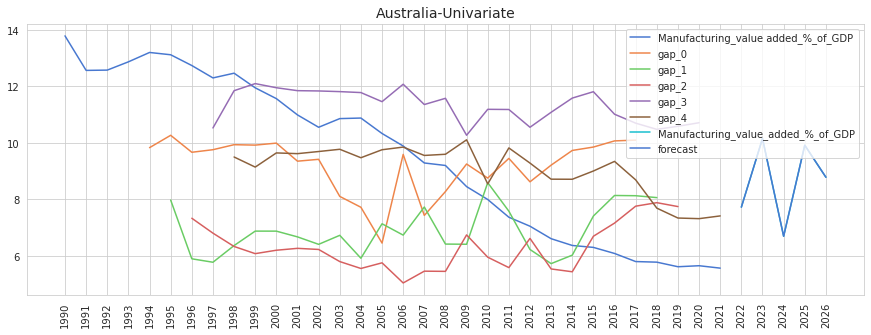

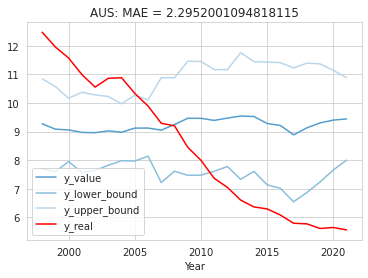

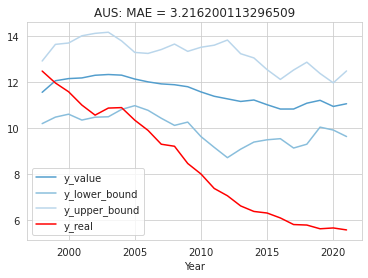

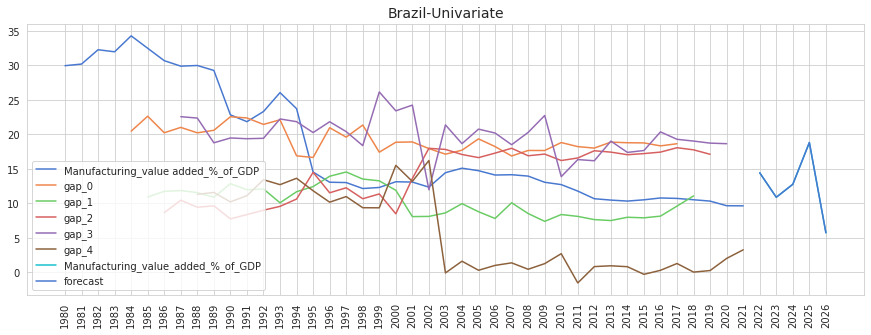

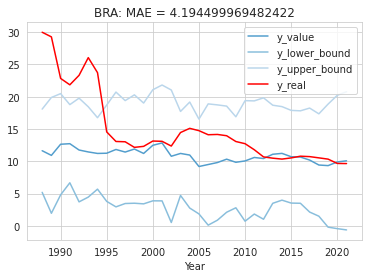

...

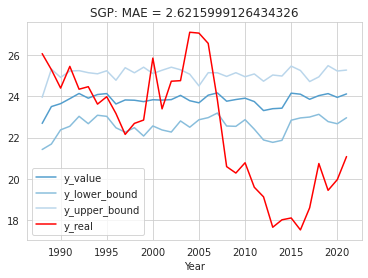

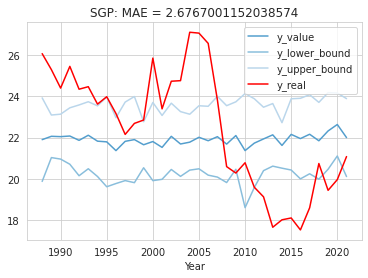

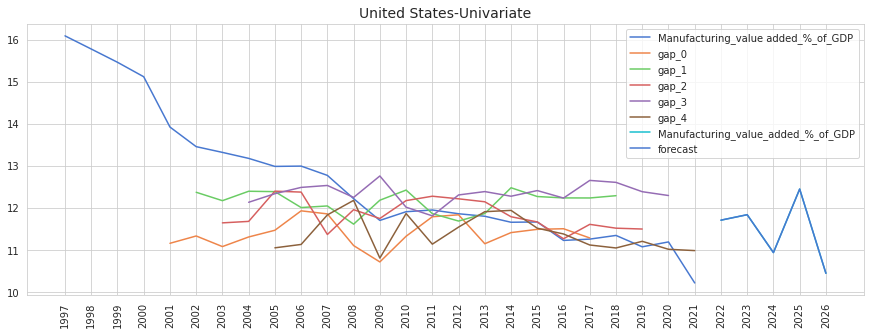

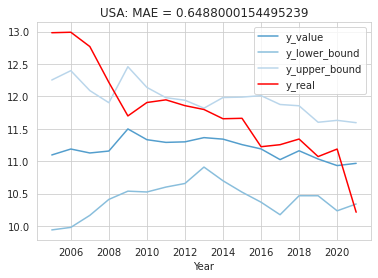

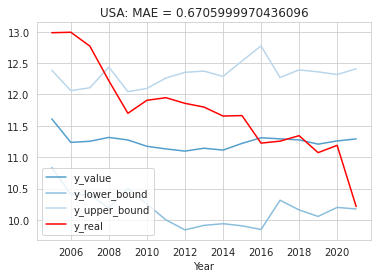

In [59]:
for ckey in m_dfs.keys():
  country = dic_country[ckey]
  data = m_dfs[ckey]
  data = data[['Manufacturing_value added_%_of_GDP']]
  rbscaler = MRobustScaler() 
  scaled_data = rbscaler.transform(data, 0.1)
  train_df, val_df, test_df=train_test_split(scaled_data, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data,
                      label_columns=[scaled_data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 20,
      "dropout_probability": 0.3,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)

  fcst = forecast(rbscaler, scaled_data, model, args, IW=IW, name = 'Manufacturing_value_added_%_of_GDP')
  fcst['forecast'] = fcst['Manufacturing_value_added_%_of_GDP']
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

In [60]:
rst_path = path_LSTM + args.experiment_name  + "/result/"
rst0 = pd.DataFrame({
  'Country': [dic_country[c] for c in m_dfs.keys()]*2,
  'Type': ['Multivariate'] * 9 + ['Univariate'] * 9,
  'MAE': MAEs,
  'RMSE': RMSEs,
  'MAPE':MAPEs
              }).sort_values('Country').set_index('Country')
rst0.to_csv(path_LSTM + f'{target_type}_result.csv')

In [61]:
rst0

,Type,MAE,RMSE,MAPE
Country,,,,
Australia,Multivariate,2.643154,3.1916442,0.25204927
Australia,Univariate,3.2161725,3.6522064,0.29471102
Brazil,Multivariate,7.306572,7.801135,0.23849306
Brazil,Univariate,5.184562,5.9136124,0.2920942
Canada,Multivariate,1.2779312,1.6643106,0.13634343
Canada,Univariate,1.3522825,1.699376,0.19710645
China,Multivariate,3.245973,3.7398007,0.040463142
China,Univariate,3.7758744,4.1358833,0.04939582
India,Multivariate,0.79011476,1.0149689,0.037888978


##### 2-Service

In [62]:
SHIFT = 5
LW = 5
IW = 4
MAX_EPOCHS = 200
bs = 8
verbose = True
lr = 0.001
patience = 100

In [63]:
target_type = 'Service'

###### Multivariate

In [64]:
model_type = 'Multivariate'

===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2770, Training Time (s): 0
Epoch [1/8], Val Loss: 0.4332,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.2562, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4760,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2675, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4636,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2289, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4471,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3060, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4409,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2600, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4263,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2178, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4212,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2479, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4235,  Validation time (s): 0
===== Evaluation =====
MAE [3.2050698, 3.0321438, 3.1770809, 2.414505, 2.0835266]  Mean MAE 2.7824647 
RMSE [3.4440656, 3.1216054, 3.3448267, 2.5292058, 2.2979753] Mean RMSE 2.9823294 
MAPE [0.047863647, 0.04527372, 0.047417905, 0.035973

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3031, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2663,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.2864, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2794,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2867, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2673,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2981, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2814,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3132, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2671,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3270, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2695,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2978, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2681,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3111, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2830,  Validation time (s): 0
===== Evaluation =====
MAE [1.8509191, 1.9715589, 1.9370232, 2.1092083, 1.6210289]  Mean MAE 1.8979477 
RMSE [2.181572, 2.203424, 2.2054596, 2.1641867, 1.8795592] Mean RMSE 2.130485 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3712, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.1765,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3715, Training Time (s): 0
Epoch [2/8], Val Loss: 0.1769,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3821, Training Time (s): 0
Epoch [3/8], Val Loss: 0.1717,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3799, Training Time (s): 0
Epoch [4/8], Val Loss: 0.1834,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3797, Training Time (s): 0
Epoch [5/8], Val Loss: 0.1627,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3684, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1663,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3653, Training Time (s): 0
Epoch [7/8], Val Loss: 0.1556,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3730, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1746,  Validation time (s): 0
===== Evaluation =====
MAE [5.1323266, 4.380072, 3.2003663, 4.07396, 3.0148265]  Mean MAE 3.9603105 
RMSE [5.8264785, 4.79929, 3.6244285, 4.6747417, 4.41993] Mean RMSE 4.7224255 
MAP

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4083, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2357,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4138, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2212,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3981, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2193,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3999, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2096,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3944, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2148,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3949, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2156,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3963, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2062,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3978, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1988,  Validation time (s): 0
===== Evaluation =====
MAE [4.591188, 3.6847236, 2.5088665, 6.6874747, 10.086876]  Mean MAE 5.511826 
RMSE [5.0033817, 4.243308, 2.8653054, 6.7753386, 10.40964] Mean RMSE 6.411167 
M

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4766, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2874,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4278, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3517,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4490, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3024,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4822, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2484,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5228, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2843,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5103, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2839,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4745, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2903,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4839, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3033,  Validation time (s): 0
===== Evaluation =====
MAE [1.3285433, 2.176812, 2.644698, 2.2608414, 3.397578]  Mean MAE 2.3616946 
RMSE [1.4674281, 2.645204, 2.9206595, 2.34546, 3.5705628] Mean RMSE 2.6807015 
MAPE [0.020012802, 0.03240128, 0.039299194, 0.033498686, 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5120, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3004,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4646, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2702,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4928, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2817,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4714, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2901,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4559, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2415,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4441, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2619,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4794, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2931,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4585, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2346,  Validation time (s): 0
===== Evaluation =====
MAE [1.1931967, 1.494306, 3.1742427, 2.1075706, 3.7023907]  Mean MAE 2.3343413 
RMSE [1.4358319, 1.8387883, 3.3436034, 2.1737165, 3.757172] Mean RMSE 2.6632245 
MAPE [0.017915495, 0.022236278, 0.047290582, 0.031235

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4207, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2115,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4193, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2623,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3956, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2615,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3897, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2847,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3865, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2708,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3779, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2450,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3739, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2502,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3648, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2965,  Validation time (s): 0
===== Evaluation =====
MAE [7.1376376, 13.618698, 11.012242, 14.137856, 12.804355]  Mean MAE 11.742158 
RMSE [7.952413, 13.816193, 11.320126, 14.305218, 12.966165] Mean RMSE 12.28848

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3327, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.4185,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3447, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4019,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3249, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4845,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3149, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4064,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3166, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4630,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3120, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4656,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3079, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4267,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3161, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4620,  Validation time (s): 0
===== Evaluation =====
MAE [12.149101, 12.329808, 12.600862, 12.50636, 15.447549]  Mean MAE 13.006738 
RMSE [12.408201, 12.734734, 12.682517, 12.838085, 15.602215] Mean RMSE 13.30585

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.7536, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2921,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.7483, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2503,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.7393, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2470,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.7299, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2501,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.6895, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3114,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.7245, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2820,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.7626, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3207,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.6796, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3098,  Validation time (s): 0
===== Evaluation =====
MAE [2.7519162, 0.5082385, 0.71939594, 0.74263257, 1.3369598]  Mean MAE 1.2118286 
RMSE [2.7919536, 0.5536171, 0.8051009, 1.1119902, 1.5707276] Mean RMSE 1.5781883 
MAPE [0.039034992, 0.007193132, 0.010168218, 0.01

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.6943, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2876,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.6592, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3010,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.7303, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2747,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.6205, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3224,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.6181, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3202,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.6705, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3148,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.7133, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2679,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.7009, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2834,  Validation time (s): 0
===== Evaluation =====
MAE [0.58723325, 0.7931798, 1.8261439, 1.5715599, 1.7431463]  Mean MAE 1.3042526 
RMSE [0.64189434, 0.8975237, 1.9919833, 1.7320715, 1.8784202] Mean RMSE 1.530628 
MAPE [0.008324016, 0.011267955, 0.025782712, 0.021

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5481, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2640,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.5600, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3188,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5516, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2734,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5509, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3066,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5149, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2845,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5636, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2664,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.5303, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2357,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4949, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3053,  Validation time (s): 0
===== Evaluation =====
MAE [4.00758, 4.2935243, 5.62009, 4.2271247, 1.478908]  Mean MAE 3.9254453 
RMSE [4.2446227, 4.598991, 5.857431, 4.5299006, 1.7252266] Mean RMSE 4.40394 
MAPE 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4358, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.4326,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4117, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3990,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4326, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4063,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4165, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4094,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3937, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4032,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4333, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4460,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4464, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4382,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4064, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4189,  Validation time (s): 0
===== Evaluation =====
MAE [4.1188564, 7.396622, 9.788914, 8.246324, 1.7357508]  Mean MAE 6.2572927 
RMSE [4.4769225, 7.446968, 9.823301, 8.404837, 2.2439616] Mean RMSE 7.038097 
MAP

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4475, Training Time (s): 0
Epoch [1/8], Val Loss: 0.4152,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4310, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4381,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3873, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4698,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4442, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4696,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4332, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4480,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4252, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4255,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4234, Training Time (s): 0
Epoch [7/8], Val Loss: 0.5575,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3996, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4848,  Validation time (s): 0
===== Evaluation =====
MAE [1.3797035, 1.7764143, 2.6476262, 2.1185353, 0.77211124]  Mean MAE 1.7388781 
RMSE [1.732344, 1.8888614, 2.746619, 2.223927, 0.89937735] Mean RMSE 1.993362 
MAPE [0.01939404, 0.025227627, 0.037854977, 0.0304633

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4201, Training Time (s): 0
Epoch [1/8], Val Loss: 0.5166,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3838, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3689,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4000, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3674,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3638, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3859,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4197, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4028,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4031, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3494,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3646, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3190,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3915, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3205,  Validation time (s): 0
===== Evaluation =====
MAE [1.4943403, 1.0106341, 0.5674553, 0.6251195, 2.5311444]  Mean MAE 1.2457387 
RMSE [1.5258096, 1.3425783, 0.6506513, 0.8360438, 2.7585738] Mean RMSE 1.6039113 
MAPE [0.021160863, 0.014494724, 0.0081264675, 0.008

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.0637093, MAE2: 2.0618694
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2086, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.6731,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.2169, Training Time (s): 0
Epoch [2/8], Val Loss: 0.7147,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.1998, Training Time (s): 0
Epoch [3/8], Val Loss: 0.6616,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2125, Training Time (s): 0
Epoch [4/8], Val Loss: 0.6505,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2076, Training Time (s): 0
Epoch [5/8], Val Loss: 0.6623,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.1992, Training Time (s): 0
Epoch [6/8], Val Loss: 0.6256,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.1940, Training Time (s): 0
Epoch [7/8], Val Loss: 0.6544,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.1899, Training Time (s): 0
Epoch [8/8], Val Loss: 0.6637,  Validation time (s): 0
===== Evaluation =====
MAE [8.524874, 6.5885625, 7.554571, 8.174813, 6.629305]  Mean MAE 7.494425 
RMSE [8.607248, 6.8365235, 7.675279, 8.27182, 6.6938996] Mean RMSE 7.654593 
MAPE [

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2830, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.6125,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.2774, Training Time (s): 0
Epoch [2/8], Val Loss: 0.5967,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2706, Training Time (s): 0
Epoch [3/8], Val Loss: 0.6062,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2824, Training Time (s): 0
Epoch [4/8], Val Loss: 0.5973,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2828, Training Time (s): 0
Epoch [5/8], Val Loss: 0.5635,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2519, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5861,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2450, Training Time (s): 0
Epoch [7/8], Val Loss: 0.6287,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2706, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5923,  Validation time (s): 0
===== Evaluation =====
MAE [8.2166195, 4.019323, 3.565894, 9.283849, 7.294925]  Mean MAE 6.476122 
RMSE [8.2363205, 4.120932, 3.7076707, 9.365862, 7.560934] Mean RMSE 6.9778647 
MAPE

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 3.2097135, MAE2: 3.2194378
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5347, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2876,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4915, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2881,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5130, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3075,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5413, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2964,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5110, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2858,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4891, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3176,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.5204, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2932,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4776, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2762,  Validation time (s): 0
===== Evaluation =====
MAE [1.6138891, 0.784153, 0.8403142, 2.264478, 2.9871864]  Mean MAE 1.6980041 
RMSE [1.7878691, 0.8812122

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4968, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3227,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.5209, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3333,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4630, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2601,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4471, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2780,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4983, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2883,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4814, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3421,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4665, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2812,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4691, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3119,  Validation time (s): 0
===== Evaluation =====
MAE [0.7344513, 0.6949857, 0.609225, 2.1132329, 3.8857167]  Mean MAE 1.6075224 
RMSE [0.8274162, 0.893955, 0.6701231, 2.406342, 4.046229] Mean RMSE 2.1952355 
MAPE [0.009564125, 0.009026806, 0.007923716, 0.02705141

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.5858998, MAE2: 2.119093


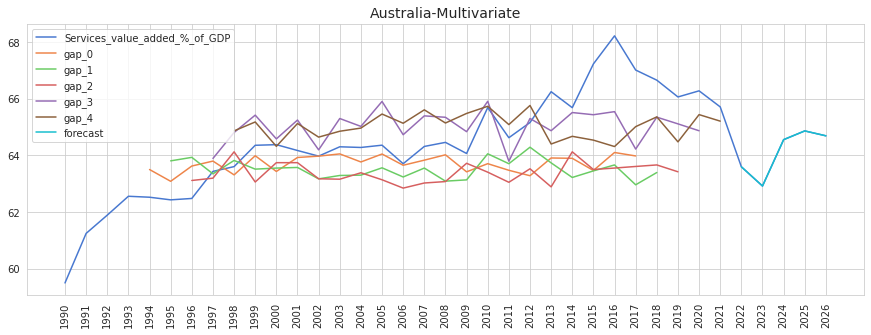

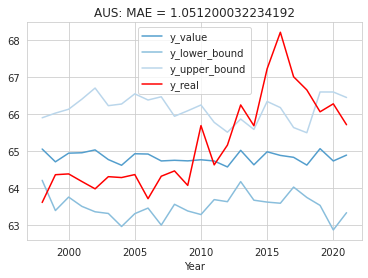

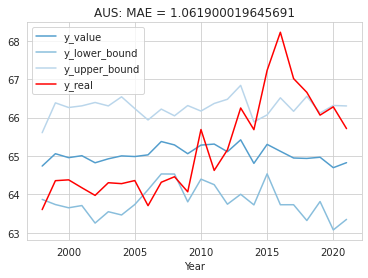

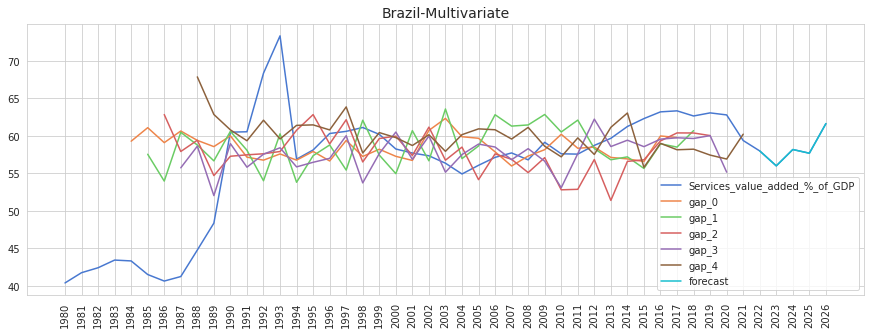

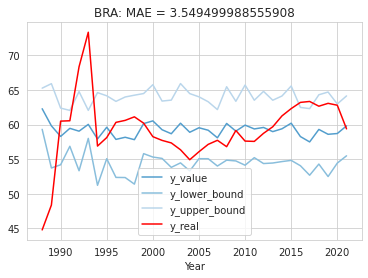

...

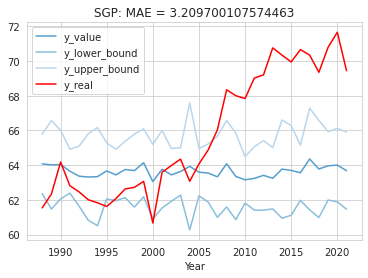

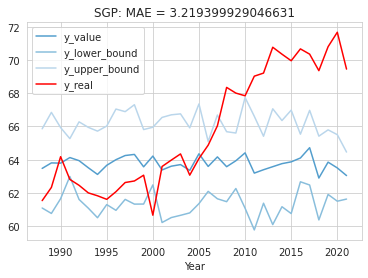

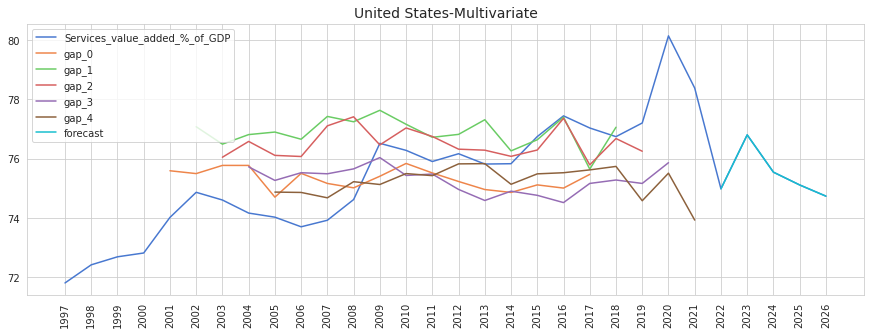

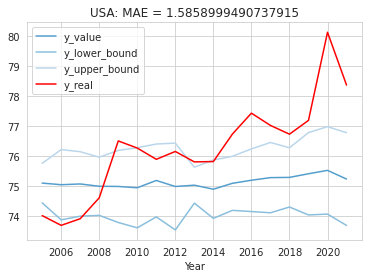

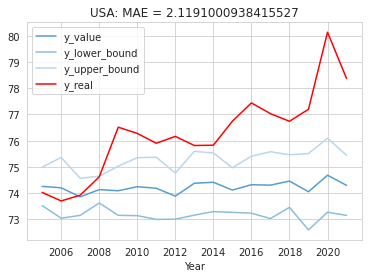

In [65]:
MAEs, RMSEs, MAPEs = [], [], []

for ckey in s_dfs.keys():
  country = dic_country[ckey]
  data = s_dfs[ckey]
  rbscaler = MRobustScaler() 
  scaled_data = rbscaler.transform(data, 0.1)
  train_df, val_df, test_df=train_test_split(scaled_data, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data,
                      label_columns=[scaled_data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.7,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)

  fcst = forecast(rbscaler, scaled_data, model, args, IW=IW, name = 'Services_value_added_%_of_GDP')
  fcst['forecast'] = fcst['Services_value_added_%_of_GDP']
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

###### Univariate

In [66]:
model_type = 'Univariate'

===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2337, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3825,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.2134, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4067,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2051, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4356,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2029, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4210,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2178, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3997,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2169, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3811,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2113, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4405,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.1939, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3692,  Validation time (s): 0
===== Evaluation =====
MAE [2.463298, 1.9497337, 2.4572048, 3.264537, 3.3135993]  Mean MAE 2.6896744 
RMSE [2.6851852, 2.1727726, 2.5210884, 3.3632684, 3.4024255] Mean RMSE 2.869673 
MAPE [0.036756676, 0.029023573, 0.03668332, 0.04868176

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2950, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3862,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3041, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2975,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2597, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3657,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3135, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3752,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2731, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3768,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2922, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4078,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2908, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3606,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2121, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3425,  Validation time (s): 0
===== Evaluation =====
MAE [2.9156501, 3.1119175, 2.2121532, 2.0127766, 2.5113156]  Mean MAE 2.5527625 
RMSE [3.1195378, 3.263973, 2.349535, 2.1866508, 2.6972427] Mean RMSE 2.7554278 
MAPE [0.043544427, 0.04638913, 0.03297523, 0.02996488

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4546, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2962,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4619, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3272,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4439, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2495,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4576, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3305,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4272, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2753,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4374, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2724,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4254, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2453,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4389, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2748,  Validation time (s): 0
===== Evaluation =====
MAE [3.266135, 13.942119, 3.0554016, 10.326444, 0.88774747]  Mean MAE 6.295569 
RMSE [3.3898995, 14.019498, 3.314287, 10.451119, 1.0760951] Mean RMSE 8.116725 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4496, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2944,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4417, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2697,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4140, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2102,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3872, Training Time (s): 0
Epoch [4/8], Val Loss: 0.1739,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3905, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2310,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3760, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1864,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4024, Training Time (s): 0
Epoch [7/8], Val Loss: 0.1786,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3894, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1658,  Validation time (s): 0
===== Evaluation =====
MAE [2.2987251, 4.754038, 3.4825313, 1.502936, 1.6254717]  Mean MAE 2.7327409 
RMSE [2.7065406, 4.9667664, 3.5690606, 1.6345477, 2.1251013] Mean RMSE 3.2224252

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3343, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3606,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3254, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3521,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3495, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3107,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3400, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4629,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3686, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3884,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3713, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3102,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3095, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3936,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3729, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4441,  Validation time (s): 0
===== Evaluation =====
MAE [2.461378, 2.6736133, 2.7792797, 3.8379624, 3.922692]  Mean MAE 3.1349852 
RMSE [2.6471326, 2.9040518

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.4002,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4367, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3498,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4217, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3036,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3971, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2705,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4409, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2608,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4136, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2848,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4245, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2806,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3822, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3474,  Validation time (s): 0
===== Evaluation =====
MAE [2.0673187, 3.515414, 2.2490978, 2.6716664, 3.7260208]  Mean MAE 2.8459036 
RMSE [2.2521296, 4.069321, 2.496294, 2.787665, 3.938069] Mean RMSE 3.1981997 
M

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5209, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2341,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4962, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4138,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5329, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3543,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4487, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3039,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5630, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3660,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5366, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3485,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4860, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2896,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4681, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3912,  Validation time (s): 0
===== Evaluation =====
MAE [6.3070903, 11.073578, 10.154536, 13.681382, 14.975014]  Mean MAE 11.23832 
RMSE [7.3518195, 11.858516, 10.321667, 13.788245, 15.06664] Mean RMSE 11.986074

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4073, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2449,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3520, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2509,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4263, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3111,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4295, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2789,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4502, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2575,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4153, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2403,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3884, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3280,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3364, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2325,  Validation time (s): 0
===== Evaluation =====
MAE [12.696134, 7.735117, 9.825025, 11.085255, 10.033766]  Mean MAE 10.27506 
RMSE [13.067068, 8.005507, 10.6657915, 11.260945, 10.086702] Mean RMSE 10.743798 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.7169, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2153,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.6779, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3826,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.8064, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2362,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.7711, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2106,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.7902, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3625,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.6991, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3711,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.6794, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2866,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.6658, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2593,  Validation time (s): 0
===== Evaluation =====
MAE [2.0464275, 2.1103172, 0.770415, 0.7906812, 2.4158223]  Mean MAE 1.6267326 
RMSE [2.2073298, 2.2555106, 0.79187113, 1.1880765, 2.5839036] Mean RMSE 1.9326032 
MAPE [0.028994173, 0.02985237, 0.010886658, 0.01099

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.6546, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3756,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.6430, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3399,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.6674, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2991,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.6203, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3431,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.6438, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4060,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.6411, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3657,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.6636, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3054,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.6100, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3257,  Validation time (s): 0
===== Evaluation =====
MAE [2.536002, 1.1902046, 0.42308298, 2.093198, 1.3650309]  Mean MAE 1.5215037 
RMSE [2.5895226, 1.2640064, 0.6349211, 2.231748, 1.7032717] Mean RMSE 1.8214444

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5264, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2549,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.5325, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2907,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5448, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3284,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5108, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2518,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5692, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2745,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5039, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3578,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4943, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2864,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.5413, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2786,  Validation time (s): 0
===== Evaluation =====
MAE [1.2037627, 1.8580908, 2.8913708, 8.487479, 2.1570537]  Mean MAE 3.319551 
RMSE [1.4330415, 2.0271149, 3.013151, 8.699832, 2.50592] Mean RMSE 4.4092765 
MA

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4204, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2981,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3874, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3401,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3989, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2955,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3898, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4194,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3922, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3779,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4027, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3828,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4091, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3439,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3937, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3860,  Validation time (s): 0
===== Evaluation =====
MAE [5.5351906, 5.9934387, 2.288812, 5.0702496, 5.529492]  Mean MAE 4.8834367 
RMSE [5.626309, 6.140503, 2.418742, 5.187149, 5.6002083] Mean RMSE 5.166823 
MAP

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3455, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2593,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3575, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3506,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3764, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3296,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3679, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3691,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3826, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3028,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3552, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2828,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3582, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3712,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3281, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3147,  Validation time (s): 0
===== Evaluation =====
MAE [1.4275755, 0.7282219, 0.555233, 0.9167175, 1.4312668]  Mean MAE 1.0118029 
RMSE [1.8450525, 0.7747294, 0.5907079, 0.9374326, 1.5168395] Mean RMSE 1.2274317 
MAPE [0.02003053, 0.010407631, 0.007939189, 0.013168

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3640, Training Time (s): 0
Epoch [1/8], Val Loss: 0.4244,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3634, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3807,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3614, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3801,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3404, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4647,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3581, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4809,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3544, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4232,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3637, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4462,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3462, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3726,  Validation time (s): 0
===== Evaluation =====
MAE [1.1943588, 1.070694, 0.73465604, 1.0915323, 0.81314087]  Mean MAE 0.9808764 
RMSE [1.2837921, 1.2758164, 1.0100341, 1.1474748, 0.8686345] Mean RMSE 1.1284701 
MAPE [0.016881026, 0.015150927, 0.010460933, 0.015

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.2156487, MAE2: 1.3465198
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2347, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.7260,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.2180, Training Time (s): 0
Epoch [2/8], Val Loss: 0.7512,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.1895, Training Time (s): 0
Epoch [3/8], Val Loss: 0.7644,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.1830, Training Time (s): 0
Epoch [4/8], Val Loss: 0.7032,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.1872, Training Time (s): 0
Epoch [5/8], Val Loss: 0.7364,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2140, Training Time (s): 0
Epoch [6/8], Val Loss: 0.7452,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2190, Training Time (s): 0
Epoch [7/8], Val Loss: 0.6900,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.1742, Training Time (s): 0
Epoch [8/8], Val Loss: 0.6792,  Validation time (s): 0
===== Evaluation =====
MAE [7.964943, 9.584416, 6.7851977, 6.8687186, 6.237637]  Mean MAE 7.488182 
RMSE [7.9849367, 9.629564, 6.8030887, 6.901764, 6.4428387] Mean RMSE 7.6408668 
MA

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2441, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.5866,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.2221, Training Time (s): 0
Epoch [2/8], Val Loss: 0.5733,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2165, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5894,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.1954, Training Time (s): 0
Epoch [4/8], Val Loss: 0.6021,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2614, Training Time (s): 0
Epoch [5/8], Val Loss: 0.5777,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2212, Training Time (s): 0
Epoch [6/8], Val Loss: 0.6073,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2030, Training Time (s): 0
Epoch [7/8], Val Loss: 0.6130,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2077, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5979,  Validation time (s): 0
===== Evaluation =====
MAE [6.445535, 7.2103486, 6.3486714, 7.619232, 7.249802]  Mean MAE 6.974718 
RMSE [6.474104, 7.2324657, 6.372022, 7.6859336, 7.3344407] Mean RMSE 7.038364 
MAP

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 3.1288915, MAE2: 3.118401
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5023, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2902,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.5121, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2058,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5386, Training Time (s): 0
Epoch [3/8], Val Loss: 0.1949,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5823, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3947,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.6080, Training Time (s): 0
Epoch [5/8], Val Loss: 0.1911,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.6133, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2335,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.6478, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2339,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4616, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3459,  Validation time (s): 0
===== Evaluation =====
MAE [1.100853, 0.5829379, 0.7730942, 1.558609, 2.4769337]  Mean MAE 1.2984855 
RMSE [1.3942164, 0.66530466, 0.8665869, 2.0169537, 2.705931] Mean RMSE 1.704559 
MAPE [0.0143035175, 0.007598845, 0.010058004, 0.019858

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====
Epoch [1/8], Train Loss: 0.3927, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3092,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4075, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2953,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4035, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3472,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3915, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3027,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3935, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3584,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3897, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3835,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3987, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2906,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3784, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2763,  Validation time (s): 0
===== Evaluation =====
MAE [0.95279056, 1.0610008, 2.4433708, 1.4777374, 3.0056598]  Mean MAE 1.7881119 
RMSE [1.1004572, 1.26039, 2.5647914, 1.9280834, 3.2159781] Mean RMSE 2.165075

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.5295006, MAE2: 1.7693988


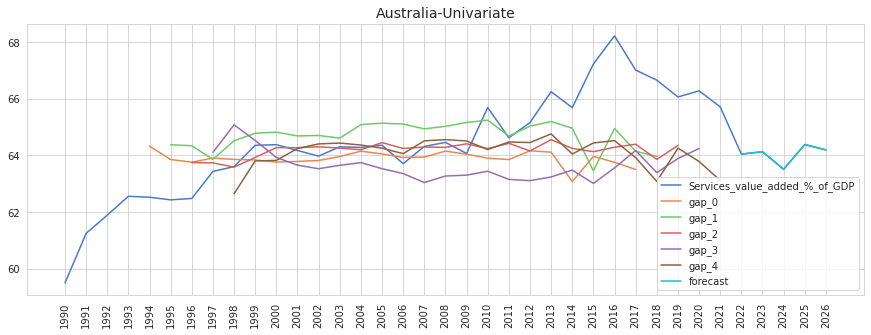

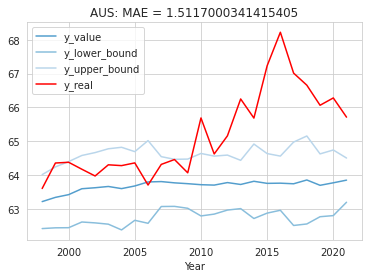

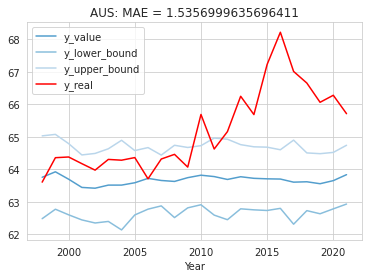

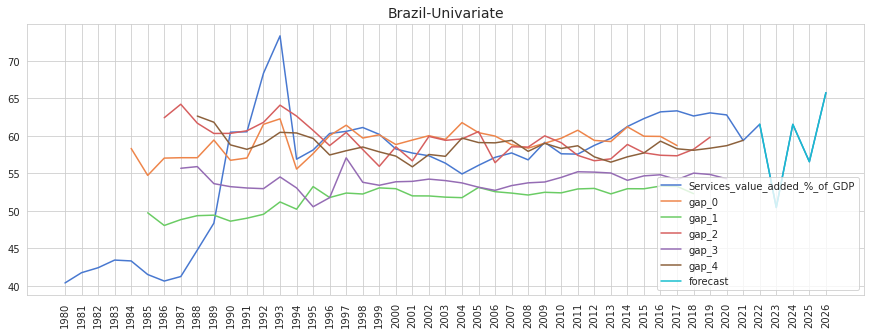

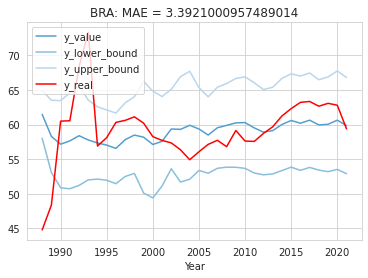

...

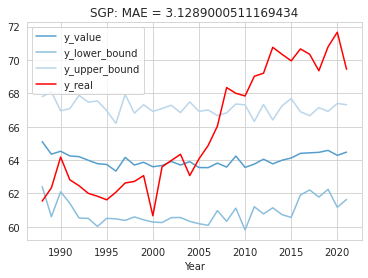

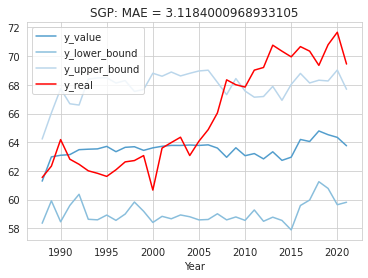

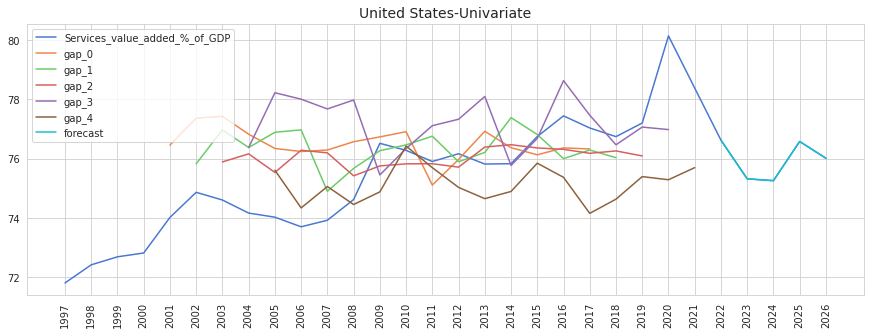

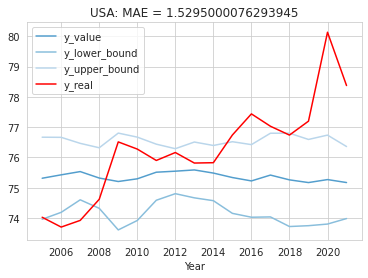

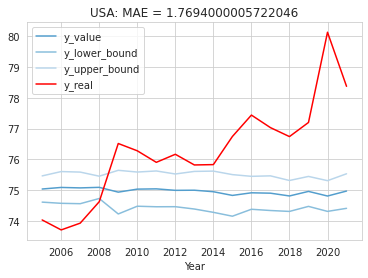

In [67]:
for ckey in s_dfs.keys():
  country = dic_country[ckey]
  data = s_dfs[ckey]
  data = data[['Services_value_added_%_of_GDP']]
  rbscaler = MRobustScaler() 
  scaled_data = rbscaler.transform(data, 0.1)
  train_df, val_df, test_df=train_test_split(scaled_data, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data,
                      label_columns=[scaled_data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.7,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)

  fcst = forecast(rbscaler, scaled_data, model, args, IW=IW, name = 'Services_value_added_%_of_GDP')
  fcst['forecast'] = fcst['Services_value_added_%_of_GDP']
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg, scaled_data,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

In [68]:
rst = pd.DataFrame({
  'Country': [dic_country[c] for c in s_dfs.keys()]*2,
  'Type': ['Multivariate'] * 9 + ['Univariate'] * 9,
  'MAE': MAEs,
  'RMSE': RMSEs,
  'MAPE':MAPEs
              }).sort_values('Country').set_index('Country')
rst.to_csv(path_LSTM + f'{target_type}_result.csv')
rst

,Type,MAE,RMSE,MAPE
Country,,,,
Australia,Multivariate,1.0618993,1.2328159,0.0168964
Australia,Univariate,1.5357391,1.9511287,0.015211031
Brazil,Multivariate,6.7987986,7.687564,0.10000714
Brazil,Univariate,3.662388,4.8573723,0.095657885
Canada,Multivariate,2.2161868,2.4920483,0.03139413
Canada,Univariate,1.9708964,2.2645457,0.026199587
China,Multivariate,6.7098765,8.200919,0.15721528
China,Univariate,5.8622785,6.9684777,0.15187395
India,Multivariate,3.5853186,4.5797825,0.09358242


### Add Fake Data: Monthly Data


- Add month (1, except the last 12)

- use 2 order polynomial to impute the missing months(11 month)

- only use the fake data to train and validate

- use the actual data to test, forecast and make plots

##### Little Example

In [73]:
  ckey = 'BRA'
  target_type = 'Manufacturing'

  
  country = dic_country[ckey]
  data = m_dfs[ckey]
  cur_col = list(data.columns)
  scaled_data1 = data.copy()
  scaled_data1['Month'] = 1
  scaled_data1.loc[2021, 'Month'] = 12
  scaled_data1 = scaled_data1[['Month'] + cur_col]
  tmp = scaled_data1.copy().reset_index()
  pd_year_month = pd.DataFrame(
      {'Year': np.array([[i] * 12 for i in list(data.index)]).reshape(-1),
       'Month':list(range(1, 13)) * len(data)
  })
  scaled_data1 = pd_year_month.merge(scaled_data1,  on = ['Year', 'Month'], how ='left')\
              .interpolate(method="polynomial", order=2)
  rbscaler = MRobustScaler()
  scaled_data1 = rbscaler.transform(scaled_data1, 0.1)
  median, qrange = rbscaler.get_fitted()
  tmp = (tmp  - median.values)/qrange
  train_df, val_df, test_df =train_test_split(tmp, IW = IW + SHIFT)
  wg0 = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                        train_df = train_df, val_df = val_df, test_df = test_df, 
                        scaled_data = tmp,
                        label_columns=[tmp.columns[-1]])
  _all = wg0.make_dataset(tmp.values)
  X = next(iter(_all))[0].numpy()
  if args.gpu: # if gpu
      X =  torch.from_numpy(X).cuda() # convert data to gpu

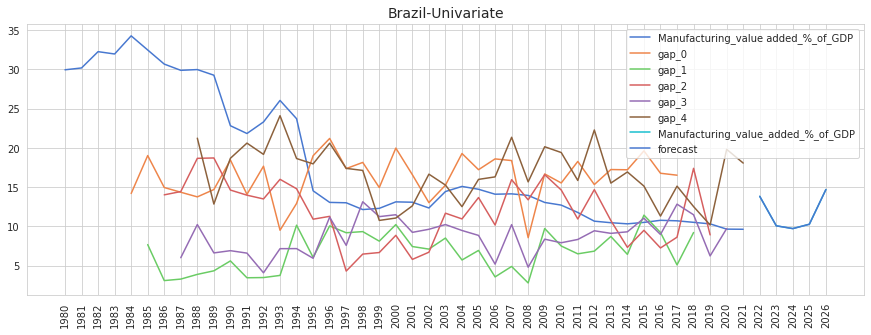

In [79]:
  _, _, test_df =train_test_split(tmp, IW = IW + SHIFT)
  train_df, val_df, _ =train_test_split(scaled_data1, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data1,
                      label_columns=[scaled_data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.7,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type,
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)
  # MAEs.append(str(round(min(MAE(y_pred, y_real)[0]), 2)) + '-' + str(round(max(MAE(y_pred, y_real)[0]),2)))
  # RMSEs.append(str(round(min(RMSE(y_pred, y_real)[0]), 2)) + '-' + str(round(max(RMSE(y_pred, y_real)[0]),2)))
  # MAPEs.append(str(round(min(MAPE(y_pred, y_real)), 2)) + '-' + str(round(max(MAPE(y_pred, y_real)),2)))
  yy = model(X.float())
  med, qrg = rbscaler.get_fitted()
  target_median, qrange = med.values[-1], qrg[-1]
  yy = yy.cpu().detach().numpy()*qrange+target_median
  fcst = forecast(rbscaler, tmp, model, args, IW=IW, name = 'Manufacturing_value_added_%_of_GDP')
  fcst['forecast'] = fcst['Manufacturing_value_added_%_of_GDP']
  fcst.index = [i for i in range(2022, 2027)]
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(yy, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(output_path + target_type +f'/{country}-{model_type}', bbox_inches='tight')

##### 1-Manufacturing

In [115]:
target_type = 'Manufacturing'

###### Multivariate

In [116]:
model_type = 'Multivariate'

===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3635, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2564,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3270, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3048,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3984, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3099,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3834, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3125,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3428, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2934,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3386, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3064,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3805, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3029,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3294, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3244,  Validation time (s): 0
===== Evaluation =====
MAE [3.0977325, 2.8112345, 1.9874052, 2.2720845, 5.142486]  Mean MAE 3.0621881 
RMSE [3.2758617, 2.837705, 2.2497888, 2.3037484, 5.1786323] Mean RMSE 3.3457696

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2923, Training Time (s): 0
Epoch [1/8], Val Loss: 0.5002,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.2549, Training Time (s): 0
Epoch [2/8], Val Loss: 0.5316,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2629, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5413,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2915, Training Time (s): 0
Epoch [4/8], Val Loss: 0.5248,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2065, Training Time (s): 0
Epoch [5/8], Val Loss: 0.5490,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3048, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5556,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2892, Training Time (s): 0
Epoch [7/8], Val Loss: 0.5589,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2371, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4802,  Validation time (s): 0
===== Evaluation =====
MAE [3.3107796, 4.2922235, 4.194384, 4.5467052, 6.3606696]  Mean MAE 4.5409527 
RMSE [3.421587, 4.5024934, 4.216662, 4.556591, 6.396336] Mean RMSE 4.7209234 
MAPE [0.52720284, 0.70434237, 0.70392513, 0.775842, 1.10

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4903, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2758,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4960, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2862,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5034, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2729,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4541, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4007,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4786, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2703,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4802, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3457,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4546, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2863,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4866, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3006,  Validation time (s): 0
===== Evaluation =====
MAE [3.5179927, 3.4308517, 2.0613902, 7.268343, 2.6512384]  Mean MAE 3.7859628 
RMSE [3.9213176, 4.2053776, 2.277311, 7.6766543, 3.4069593] Mean RMSE 4.6644716

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4811, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2339,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4973, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2199,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4747, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2643,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4864, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2260,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4735, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2314,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4995, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2043,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4739, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2202,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4706, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2009,  Validation time (s): 0
===== Evaluation =====
MAE [1.5831076, 6.0834756, 3.0486624, 1.638577, 3.192356]  Mean MAE 3.1092355 
RMSE [1.9092087, 6.6103044, 3.6810591, 2.2658968, 3.5616808] Mean RMSE 3.9676507

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5229, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2324,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.5631, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2666,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5562, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2776,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5938, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2376,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5602, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3019,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5368, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2253,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.5197, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2698,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.5759, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2468,  Validation time (s): 0
===== Evaluation =====
MAE [0.89110804, 1.770259, 1.7270869, 3.026847, 1.432696]  Mean MAE 1.7695993 
RMSE [1.0854293, 2.1564102

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.1718,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3886, Training Time (s): 0
Epoch [2/8], Val Loss: 0.1910,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4711, Training Time (s): 0
Epoch [3/8], Val Loss: 0.1509,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4381, Training Time (s): 0
Epoch [4/8], Val Loss: 0.1289,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3907, Training Time (s): 0
Epoch [5/8], Val Loss: 0.1916,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4113, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1684,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4356, Training Time (s): 0
Epoch [7/8], Val Loss: 0.1212,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4169, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1593,  Validation time (s): 0
===== Evaluation =====
MAE [0.94804716, 0.5510707, 1.5601734, 1.497023, 1.5370334]  Mean MAE 1.2186697 
RMSE [1.2436541, 0.65821654, 1.9865357, 1.8124524, 1.9415219] Mean RMSE 1.6112

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([2, 5, 1])) that is different to the input size (torch.Size([10])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([4, 5, 1])) that is different to the input size (torch.Size([20])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.1348, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2478,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.1782, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2518,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2552, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2361,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2320, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2559,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2085, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2421,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.1858, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2453,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2223, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2297,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.1418, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2142,  Validation time (s): 0
===== Evaluation =====
MAE [1.2596449, 2.0967433, 3.5450761, 3.3393867, 4.575714]  Mean MAE 2.963313 
RMSE [1.7158239, 2.4548483

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([2, 5, 1])) that is different to the input size (torch.Size([10])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([4, 5, 1])) that is different to the input size (torch.Size([20])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3270,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3659, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3027,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2357, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3150,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3607, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3172,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2390, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2949,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3617, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3334,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2060, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2958,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2816, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2402,  Validation time (s): 0
===== Evaluation =====
MAE [1.5317024, 1.079978, 3.2820024, 4.661244, 3.4307191]  Mean MAE 2.7971292 
RMSE [1.7172645, 1.539437, 3.916582, 4.7911215, 3.5494895] Mean RMSE 3.352975 
M

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.6250, Training Time (s): 0
Epoch [1/8], Val Loss: 0.1673,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.5210, Training Time (s): 0
Epoch [2/8], Val Loss: 0.1633,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5573, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2312,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5549, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2074,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5553, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2624,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5139, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1594,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4951, Training Time (s): 0
Epoch [7/8], Val Loss: 0.1418,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.6193, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2169,  Validation time (s): 0
===== Evaluation =====
MAE [0.63380975, 2.135749, 0.90836453, 0.9819422, 1.0508406]  Mean MAE 1.1421412 
RMSE [0.71683145, 2.1814475, 1.2058672, 1.0801793, 1.2657373] Mean RMSE 1.3780824 
MAPE [0.06840805, 0.23463495, 0.09903947, 0.11052

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4755, Training Time (s): 0
Epoch [1/8], Val Loss: 0.1375,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4449, Training Time (s): 0
Epoch [2/8], Val Loss: 0.1550,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4318, Training Time (s): 0
Epoch [3/8], Val Loss: 0.1574,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4666, Training Time (s): 0
Epoch [4/8], Val Loss: 0.1553,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4260, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2154,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3787, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1315,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4373, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2233,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4073, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1695,  Validation time (s): 0
===== Evaluation =====
MAE [0.627539, 2.0048096, 1.6656262, 0.48272404, 0.74495363]  Mean MAE 1.1051306 
RMSE [0.6854195, 2.1234198, 1.8602875, 0.562469, 1.0633368] Mean RMSE 1.4061605 
MAPE [0.06853039, 0.22094618, 0.18535084, 0.0540055

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4276, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.5245,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4268, Training Time (s): 0
Epoch [2/8], Val Loss: 0.5182,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4256, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5084,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4089, Training Time (s): 0
Epoch [4/8], Val Loss: 0.5207,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4154, Training Time (s): 0
Epoch [5/8], Val Loss: 0.5070,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4114, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5107,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4151, Training Time (s): 0
Epoch [7/8], Val Loss: 0.5058,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4119, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5121,  Validation time (s): 0
===== Evaluation =====
MAE [0.9899319, 0.9777362, 0.88141394, 1.4840593, 1.2388949]  Mean MAE 1.1144073 
RMSE [1.0631841, 0.98903126, 1.2212921, 1.7711698, 1.3697273] Mean RMSE 1.312

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4225, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.5049,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4321, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4938,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4152, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5115,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4102, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4997,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4097, Training Time (s): 0
Epoch [5/8], Val Loss: 0.5178,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4169, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5107,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4228, Training Time (s): 0
Epoch [7/8], Val Loss: 0.5134,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4101, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5243,  Validation time (s): 0
===== Evaluation =====
MAE [0.9027276, 0.86371833, 1.5892305, 1.44746, 1.0313262]  Mean MAE 1.1668925 
RMSE [0.96204776, 0.87586564, 1.717422, 1.7328137, 1.2250746] Mean RMSE 1.35245

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3767, Training Time (s): 0
Epoch [1/8], Val Loss: 0.5673,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3761, Training Time (s): 0
Epoch [2/8], Val Loss: 0.5983,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3881, Training Time (s): 0
Epoch [3/8], Val Loss: 0.6115,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3381, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4503,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3749, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4663,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3423, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4795,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3458, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4649,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3454, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5255,  Validation time (s): 0
===== Evaluation =====
MAE [1.7370714, 1.6479645, 1.4555197, 0.55074185, 0.48172283]  Mean MAE 1.174604 
RMSE [1.8372724, 1.6754152, 1.5624155, 0.67113817, 0.62551826] Mean RMSE 1.3758943 
MAPE [0.08767293, 0.08215796, 0.07228323, 0.0272

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4464, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3631,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4741, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3937,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4379, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3417,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4501, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3570,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4593, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3235,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4249, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3446,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4324, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3471,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4251, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3325,  Validation time (s): 0
===== Evaluation =====
MAE [0.4799026, 0.4733499, 1.0892664, 0.75902206, 0.75587624]  Mean MAE 0.7114834 
RMSE [0.7437901, 0.5291167, 1.1362796, 0.80666494, 0.90191203] Mean RMSE 0.8471685 
MAPE [0.024554355, 0.023269026, 0.053921223, 0.

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.83926135, MAE2: 0.9332755
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4072, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.7446,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4138, Training Time (s): 0
Epoch [2/8], Val Loss: 0.7547,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3906, Training Time (s): 0
Epoch [3/8], Val Loss: 0.7317,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3891, Training Time (s): 0
Epoch [4/8], Val Loss: 0.7055,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4035, Training Time (s): 0
Epoch [5/8], Val Loss: 0.7580,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3799, Training Time (s): 0
Epoch [6/8], Val Loss: 0.7464,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3784, Training Time (s): 0
Epoch [7/8], Val Loss: 0.7199,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3805, Training Time (s): 0
Epoch [8/8], Val Loss: 0.7447,  Validation time (s): 0
===== Evaluation =====
MAE [6.149137, 6.489567, 5.8860855, 3.3849256, 1.913415]  Mean MAE 4.764626 
RMSE [6.1845903, 6.5900164, 6.0078483, 3.4468546, 2.7426877] Mean RMSE 5.2378407 


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:83: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3542, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.7548,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3412, Training Time (s): 0
Epoch [2/8], Val Loss: 0.7639,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3487, Training Time (s): 0
Epoch [3/8], Val Loss: 0.7045,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3465, Training Time (s): 0
Epoch [4/8], Val Loss: 0.7675,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3319, Training Time (s): 0
Epoch [5/8], Val Loss: 0.7852,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3488, Training Time (s): 0
Epoch [6/8], Val Loss: 0.7779,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3311, Training Time (s): 0
Epoch [7/8], Val Loss: 0.7689,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3286, Training Time (s): 0
Epoch [8/8], Val Loss: 0.7489,  Validation time (s): 0
===== Evaluation =====
MAE [4.5531707, 6.411419, 4.257677, 4.8981423, 4.52202]  Mean MAE 4.9284863 
RMSE [4.6256833, 6.576024, 4.360379, 5.2376776, 4.5656276] Mean RMSE 5.1367726 
MA

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 2.377085, MAE2: 2.741609
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4259, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2122,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4607, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2301,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4227, Training Time (s): 0
Epoch [3/8], Val Loss: 0.1973,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4454, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2091,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4575, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2200,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4781, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1258,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4265, Training Time (s): 0
Epoch [7/8], Val Loss: 0.1635,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4186, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2447,  Validation time (s): 0
===== Evaluation =====
MAE [0.28392538, 0.30176243, 0.4853449, 1.1475786, 1.2722012]  Mean MAE 0.69816244 
RMSE [0.35311326, 0.3

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:83: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3713, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2474,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3553, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2860,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3736, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2343,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3584, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2712,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3664, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2272,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3465, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2415,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3215, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2630,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3822, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2688,  Validation time (s): 0
===== Evaluation =====
MAE [0.8359685, 0.5448699, 1.422308, 1.3736525, 0.98181725]  Mean MAE 1.0317233 
RMSE [0.88624555, 0.6798

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.9001517, MAE2: 0.4944795


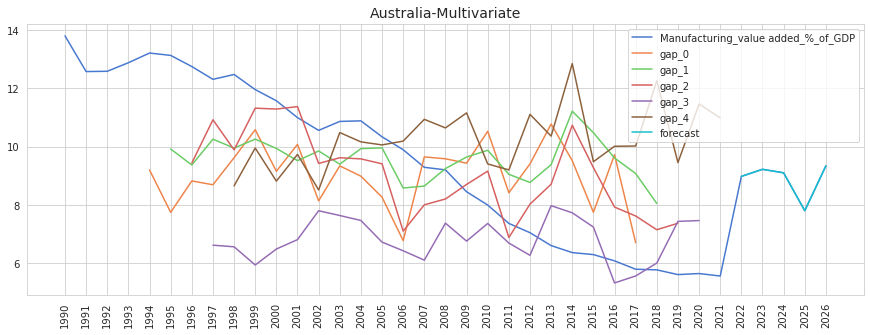

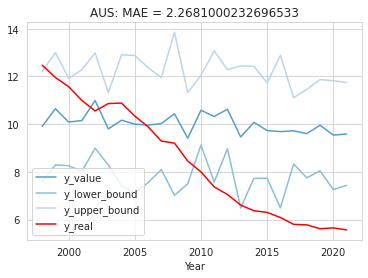

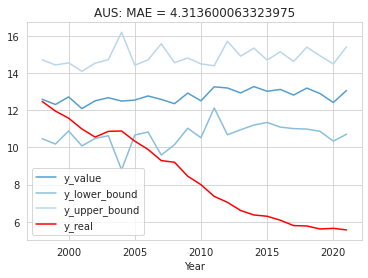

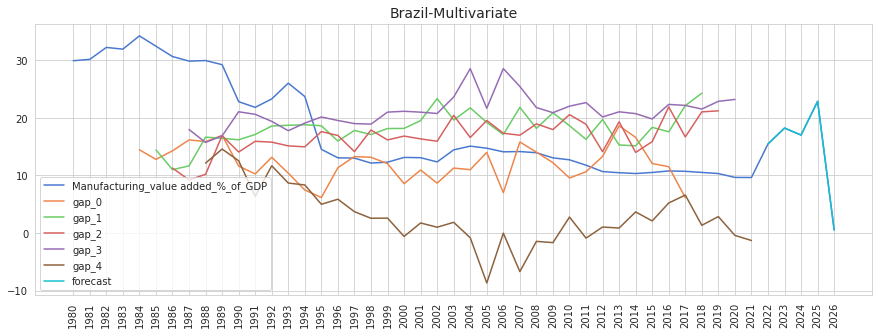

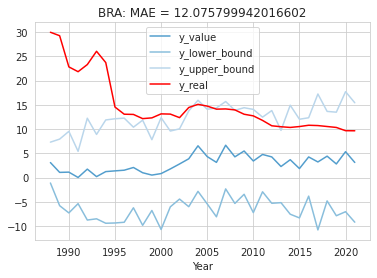

...

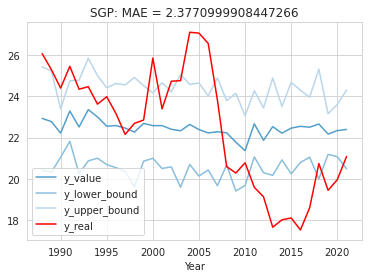

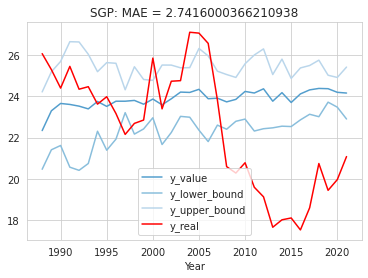

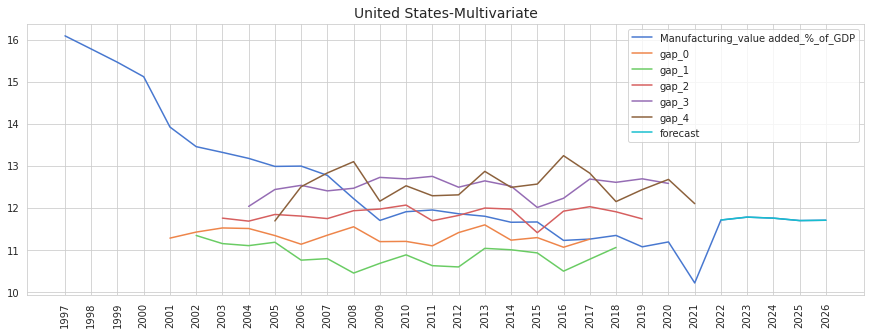

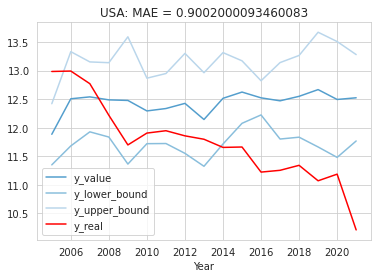

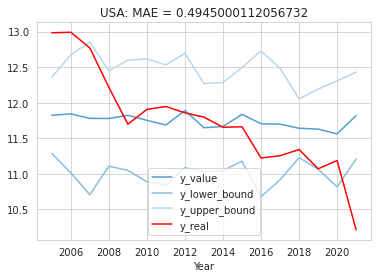

In [117]:
MAEs, RMSEs, MAPEs = [], [], []

for ckey in m_dfs.keys():
  country = dic_country[ckey]
  data = m_dfs[ckey]
  cur_col = list(data.columns)
  scaled_data1 = data.copy()
  scaled_data1['Month'] = 1
  scaled_data1.loc[2021, 'Month'] = 12
  scaled_data1 = scaled_data1[['Month'] + cur_col]
  tmp = scaled_data1.copy().reset_index()
  tmp.index = scaled_data1.index
  pd_year_month = pd.DataFrame(
      {'Year': np.array([[i] * 12 for i in list(data.index)]).reshape(-1),
       'Month':list(range(1, 13)) * len(data)
  })
  scaled_data1 = pd_year_month.merge(scaled_data1,  on = ['Year', 'Month'], how ='left')\
              .interpolate(method="polynomial", order=2)
  rbscaler = MRobustScaler()
  scaled_data1 = rbscaler.transform(scaled_data1, 0.1)
  median, qrange = rbscaler.get_fitted()
  tmp = (tmp  - median.values)/qrange
  train_df, val_df, test_df =train_test_split(tmp, IW = IW + SHIFT)
  wg0 = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                        train_df = train_df, val_df = val_df, test_df = test_df, 
                        scaled_data = tmp,
                        label_columns=[tmp.columns[-1]])
  _all = wg0.make_dataset(tmp.values)
  X = next(iter(_all))[0].numpy()
  if args.gpu: # if gpu
      X =  torch.from_numpy(X).cuda() # convert data to gpu

  _, _, test_df =train_test_split(tmp, IW = IW + SHIFT)
  train_df, val_df, _ =train_test_split(scaled_data1, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data1,
                      label_columns=[data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.7,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type + '_monthly',
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)

  fcst = forecast(rbscaler, tmp, model, args, IW=IW, name = data.columns[-1])
  fcst['forecast'] = fcst[data.columns[-1]]
  fcst.index = [2022, 2023, 2024, 2025, 2026]
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )

  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg0, tmp,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg0, tmp,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

###### Univariate

In [118]:
model_type = 'Univariate'

===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3384, Training Time (s): 0
Epoch [1/8], Val Loss: 0.4470,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3189, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4683,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2808, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4061,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3178, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4412,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3254, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4498,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2841, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4484,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3064, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4655,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2934, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4915,  Validation time (s): 0
===== Evaluation =====
MAE [1.5201969, 4.6872687, 5.755688, 4.623186, 5.7012763]  Mean MAE 4.457524 
RMSE [1.6472019, 4.775671, 6.0196233, 4.6629715, 5.7061086] Mean RMSE 4.817865 
MAPE [0.2439226, 0.762331, 0.96974593, 0.7903278, 0.9921

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3957, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2714,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3554, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3700,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4110, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3217,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3803, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4700,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3924, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3797,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3763, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3095,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4077, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4095,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3501, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3040,  Validation time (s): 0
===== Evaluation =====
MAE [3.1917608, 4.028086, 5.235149, 0.6854906, 2.101164]  Mean MAE 3.0483308 
RMSE [3.3307607, 4.084707, 5.275759, 0.832935, 2.1253371] Mean RMSE 3.4877865 
MAPE [0.4970472, 0.6594131, 0.87836695, 0.11407795, 0.366

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3721, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2374,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4001, Training Time (s): 0
Epoch [2/8], Val Loss: 0.1993,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3890, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2463,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3657, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2098,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4066, Training Time (s): 0
Epoch [5/8], Val Loss: 0.1871,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3858, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1990,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3797, Training Time (s): 0
Epoch [7/8], Val Loss: 0.1620,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3635, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2012,  Validation time (s): 0
===== Evaluation =====
MAE [4.2216167, 3.2757776, 3.4410021, 8.16633, 10.992058]  Mean MAE 6.0193563 
RMSE [4.4492617, 3.357442, 3.5778332, 8.247978, 11.293636] Mean RMSE 6.9201818 


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5255, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.4136,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4903, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3365,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5491, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4114,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5660, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3016,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4913, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3173,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5075, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3021,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.5262, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3229,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.5226, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3271,  Validation time (s): 0
===== Evaluation =====
MAE [4.0097427, 2.555422, 2.9650695, 8.601139, 11.992633]  Mean MAE 6.024801 
RMSE [4.122654, 2.8115556, 3.2561944, 10.068618, 12.076612] Mean RMSE 7.519648 
M

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3091, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2123,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3574, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2649,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3857, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2047,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3413, Training Time (s): 0
Epoch [4/8], Val Loss: 0.1734,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3390, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2716,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3562, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1769,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3122, Training Time (s): 0
Epoch [7/8], Val Loss: 0.1734,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3639, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1724,  Validation time (s): 0
===== Evaluation =====
MAE [0.9069912, 1.5763508, 1.850299, 1.014367, 3.6577206]  Mean MAE 1.8011458 
RMSE [1.0061669, 1.7810576

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2366,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3609, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3506,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3559, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3049,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4264, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3314,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3520, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2751,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4155, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2574,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3131, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2310,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4116, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1577,  Validation time (s): 0
===== Evaluation =====
MAE [2.3519008, 1.7045932, 1.0385474, 0.8216717, 4.272463]  Mean MAE 2.0378351 
RMSE [2.405224, 1.8294222, 1.3974799, 0.9455026, 4.3337946] Mean RMSE 2.4803462

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([2, 5, 1])) that is different to the input size (torch.Size([10])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.1895, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2504,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([4, 5, 1])) that is different to the input size (torch.Size([20])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.1179, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2437,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2026, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2491,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2074, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2474,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.1947, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2510,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.1733, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2606,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.1790, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2354,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2670, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2345,  Validation time (s): 0
===== Evaluation =====
MAE [2.4449186, 1.895855, 3.322877, 3.2960656, 1.2674822]  Mean MAE 2.4454396 
RMSE [2.873358, 2.2126014, 3.525936, 3.428015, 1.6474026] Mean RMSE 2.8301673 
MAPE [0.08497405, 0.066911295, 0.11894312, 0.12027514, 0

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([2, 5, 1])) that is different to the input size (torch.Size([10])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([4, 5, 1])) that is different to the input size (torch.Size([20])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3337,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3596, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3499,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5158, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2605,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2614, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2702,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2160, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4247,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2897, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2592,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2494, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2878,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.1803, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3449,  Validation time (s): 0
===== Evaluation =====
MAE [1.4785614, 3.7451112, 3.1894474, 3.6989524, 2.2354422]  Mean MAE 2.8695028 
RMSE [1.6692395, 4.306766, 3.5565012, 3.8606043, 2.368004] Mean RMSE 3.3013635

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4546, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3719,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4454, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2983,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4487, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2965,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4277, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3801,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4371, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2392,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4033, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3309,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3958, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3647,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4043, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2218,  Validation time (s): 0
===== Evaluation =====
MAE [2.1381953, 1.6214412, 0.73968905, 3.2242234, 1.1333739]  Mean MAE 1.7713845 
RMSE [2.163397, 1.7507366, 0.79334295, 3.26275, 1.2604743] Mean RMSE 2.0302262 
MAPE [0.23219876, 0.17796184, 0.081637405, 0.3615885

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4214, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2953,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3951, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2464,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4018, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2604,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4091, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2088,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3956, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2750,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4230, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3257,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4043, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2855,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4062, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2866,  Validation time (s): 0
===== Evaluation =====
MAE [0.91596264, 2.242682, 0.5028127, 4.113997, 0.12607606]  Mean MAE 1.5803063 
RMSE [1.0645214, 2.3057609, 0.56009984, 4.1771955, 0.13941884] Mean RMSE 2.201447 
MAPE [0.0995504, 0.2453806, 0.05612458, 0.46037886

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3873, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.4622,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3857, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4698,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3822, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4742,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3803, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4663,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3780, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4713,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3827, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4673,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3822, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4686,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3840, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4722,  Validation time (s): 0
===== Evaluation =====
MAE [0.7175579, 1.0926799, 1.254891, 1.3084602, 1.7828542]  Mean MAE 1.2312887 
RMSE [0.7943741, 1.110645, 1.4480594, 1.5458268, 1.9126966] Mean RMSE 1.4148799

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4479, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.5245,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4581, Training Time (s): 0
Epoch [2/8], Val Loss: 0.5360,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4513, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5420,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4435, Training Time (s): 0
Epoch [4/8], Val Loss: 0.5269,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4207, Training Time (s): 0
Epoch [5/8], Val Loss: 0.5231,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4593, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5373,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4442, Training Time (s): 0
Epoch [7/8], Val Loss: 0.5464,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4294, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5173,  Validation time (s): 0
===== Evaluation =====
MAE [0.86142683, 0.6704645, 0.6779876, 1.5754342, 1.7038313]  Mean MAE 1.097829 
RMSE [0.911193, 0.740975, 1.0375768, 1.685206, 1.8632436] Mean RMSE 1.3241962 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3574, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3185,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3607, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3803,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3417, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4305,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3465, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3695,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3765, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3431,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3531, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3475,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3580, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3499,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3582, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3669,  Validation time (s): 0
===== Evaluation =====
MAE [0.4114822, 0.82791454, 1.0688654, 0.44115448, 1.6804066]  Mean MAE 0.88596463 
RMSE [0.52642536, 0.9310727, 1.1596718, 0.4957037, 1.9150786] Mean RMSE 1.1315571 
MAPE [0.020963473, 0.041562203, 0.053162426, 0.

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3682, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3529,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3689, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3402,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3464, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3447,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3517, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3857,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3293, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3754,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3173, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3352,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2777, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3744,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3375, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3430,  Validation time (s): 0
===== Evaluation =====
MAE [1.0512165, 0.67707664, 0.94257385, 0.39352098, 0.769756]  Mean MAE 0.7668288 
RMSE [1.1889321, 0.9150756, 1.0010194, 0.54710376, 1.0075514] Mean RMSE 0.9557662 
MAPE [0.053291053, 0.034325663, 0.04669103, 0.01

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.0769081, MAE2: 0.6973956
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4629, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.6221,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4365, Training Time (s): 0
Epoch [2/8], Val Loss: 0.6239,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4345, Training Time (s): 0
Epoch [3/8], Val Loss: 0.6452,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4430, Training Time (s): 0
Epoch [4/8], Val Loss: 0.6433,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4539, Training Time (s): 0
Epoch [5/8], Val Loss: 0.6221,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4428, Training Time (s): 0
Epoch [6/8], Val Loss: 0.6154,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4429, Training Time (s): 0
Epoch [7/8], Val Loss: 0.6205,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4339, Training Time (s): 0
Epoch [8/8], Val Loss: 0.6325,  Validation time (s): 0
===== Evaluation =====
MAE [4.3131337, 3.876379, 4.414099, 2.4548063, 5.0734515]  Mean MAE 4.026374 
RMSE [4.361019, 3.9787605, 4.6797566, 2.659984, 5.1890955] Mean RMSE 4.260314 
MA

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3287, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.7245,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3419, Training Time (s): 0
Epoch [2/8], Val Loss: 0.7693,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3222, Training Time (s): 0
Epoch [3/8], Val Loss: 0.7122,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3271, Training Time (s): 0
Epoch [4/8], Val Loss: 0.7354,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3379, Training Time (s): 0
Epoch [5/8], Val Loss: 0.7554,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3265, Training Time (s): 0
Epoch [6/8], Val Loss: 0.7449,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3235, Training Time (s): 0
Epoch [7/8], Val Loss: 0.7463,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3466, Training Time (s): 0
Epoch [8/8], Val Loss: 0.7292,  Validation time (s): 0
===== Evaluation =====
MAE [5.0037503, 5.8877826, 5.6739984, 4.125604, 4.3079934]  Mean MAE 4.999826 
RMSE [5.040743, 5.970893, 5.7785735, 4.3353343, 4.5156913] Mean RMSE 5.1698966 


/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 2.5830078, MAE2: 2.58705
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3064, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2342,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3608, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2131,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4048, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2095,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3512, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2104,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3431, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2206,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3952, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1854,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4186, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3205,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3655, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2615,  Validation time (s): 0
===== Evaluation =====
MAE [0.80517787, 1.7015961, 0.37274632, 0.450524, 1.1176502]  Mean MAE 0.8895388 
RMSE [0.8229462, 1.7059828, 0.41023892, 0.48415422, 1.1799927] Mean RMSE 1.0375646 
MAPE [0.06987024, 0.14827912, 0.03306746, 0.0401

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3556, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2568,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3310, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2342,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3567, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2672,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3347, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2683,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3310, Training Time (s): 0
Epoch [5/8], Val Loss: 0.1751,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3652, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2162,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3529, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2588,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3172, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2120,  Validation time (s): 0
===== Evaluation =====
MAE [0.29479408, 1.0150938, 0.45774046, 0.61954784, 2.0422373]  Mean MAE 0.8858826 
RMSE [0.37551948, 1.0519807, 0.55412865, 0.7511688, 2.078448] Mean RMSE 1.1

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.5804938, MAE2: 0.8955343


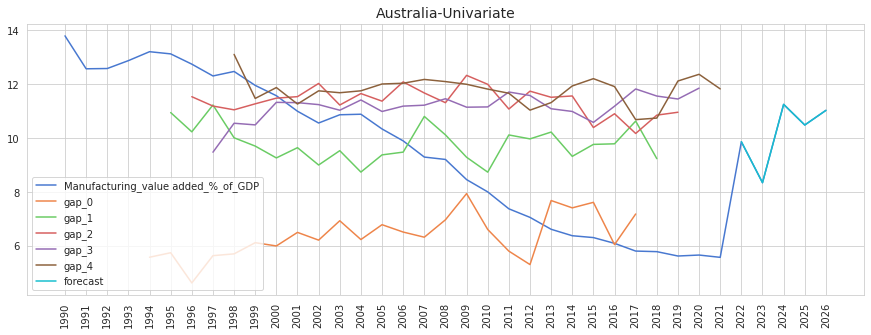

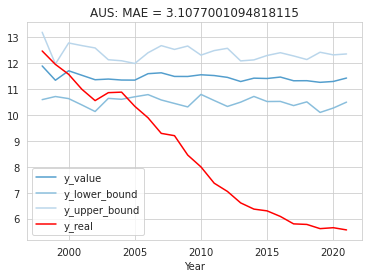

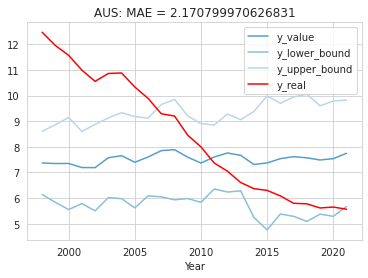

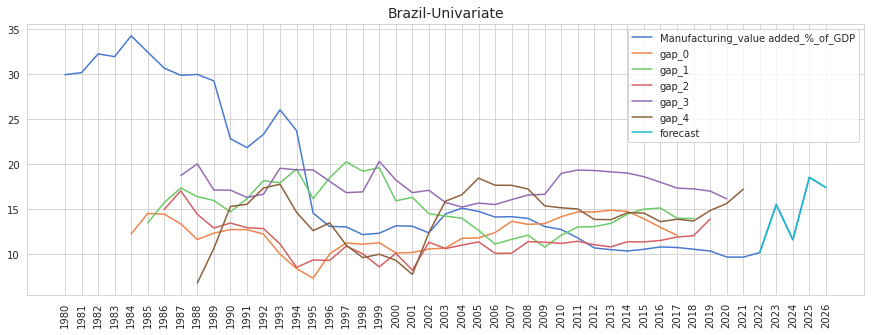

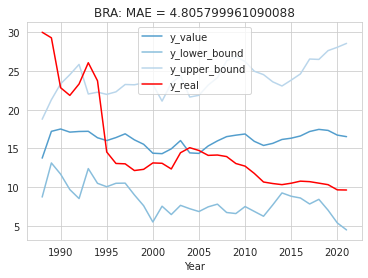

...

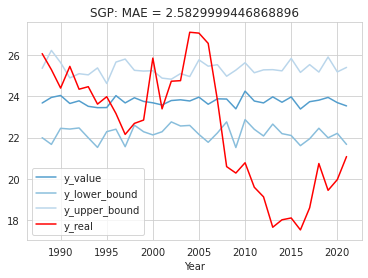

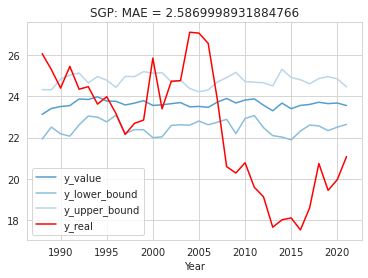

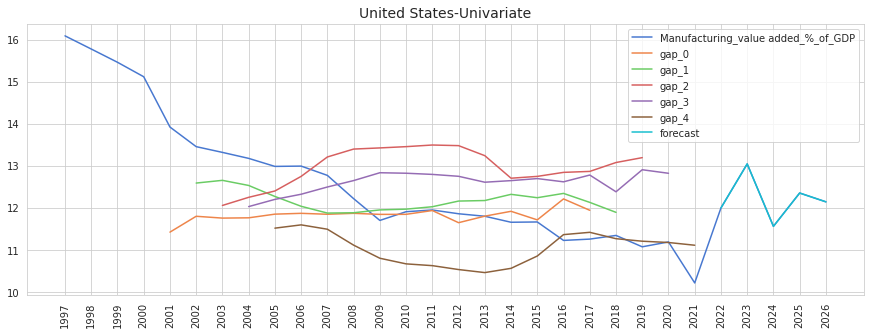

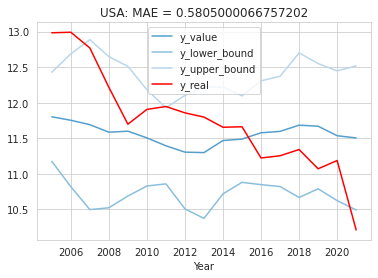

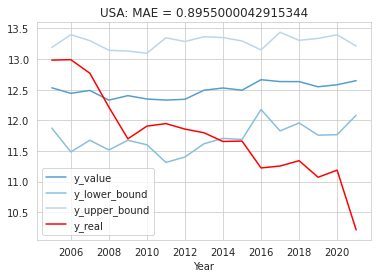

In [119]:
for ckey in m_dfs.keys():
  country = dic_country[ckey]
  data = m_dfs[ckey]
  data = data[['Manufacturing_value added_%_of_GDP']]
  cur_col = list(data.columns)
  scaled_data1 = data.copy()
  scaled_data1['Month'] = 1
  scaled_data1.loc[2021, 'Month'] = 12
  scaled_data1 = scaled_data1[['Month'] + cur_col]
  tmp = scaled_data1.copy().reset_index()
  tmp.index = scaled_data1.index
  pd_year_month = pd.DataFrame(
      {'Year': np.array([[i] * 12 for i in list(data.index)]).reshape(-1),
       'Month':list(range(1, 13)) * len(data)
  })
  scaled_data1 = pd_year_month.merge(scaled_data1,  on = ['Year', 'Month'], how ='left')\
              .interpolate(method="polynomial", order=2)
  rbscaler = MRobustScaler()
  scaled_data1 = rbscaler.transform(scaled_data1, 0.1)
  median, qrange = rbscaler.get_fitted()
  tmp = (tmp  - median.values)/qrange
  train_df, val_df, test_df =train_test_split(tmp, IW = IW + SHIFT)
  wg0 = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                        train_df = train_df, val_df = val_df, test_df = test_df, 
                        scaled_data = tmp,
                        label_columns=[tmp.columns[-1]])
  _all = wg0.make_dataset(tmp.values)
  X = next(iter(_all))[0].numpy()
  if args.gpu: # if gpu
      X =  torch.from_numpy(X).cuda() # convert data to gpu

  _, _, test_df =train_test_split(tmp, IW = IW + SHIFT)
  train_df, val_df, _ =train_test_split(scaled_data1, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data1,
                      label_columns=[data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.7,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type + '_monthly',
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)

  fcst = forecast(rbscaler, tmp, model, args, IW=IW, name = data.columns[-1])
  fcst['forecast'] = fcst[data.columns[-1]]
  fcst.index = [2022, 2023, 2024, 2025, 2026]
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg0, tmp,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg0, tmp,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

In [120]:
rst_path = path_LSTM + args.experiment_name  + "/result/"
rst0 = pd.DataFrame({
  'Country': [dic_country[c] for c in m_dfs.keys()]*2,
  'Type': ['Multivariate'] * 9 + ['Univariate'] * 9,
  'MAE': MAEs,
  'RMSE': RMSEs,
  'MAPE':MAPEs
              }).sort_values('Country').set_index('Country')
rst0.to_csv(path_LSTM + f'{target_type}_monthly_result.csv')

rst0

,Type,MAE,RMSE,MAPE
Country,,,,
Australia,Multivariate,4.313551,4.9996667,0.23127127
Australia,Univariate,2.1707633,2.5412498,0.29258132
Brazil,Multivariate,4.435464,6.462385,0.39460322
Brazil,Univariate,6.643418,6.9604044,0.36828488
Canada,Multivariate,1.2023206,1.6128638,0.159574
Canada,Univariate,3.1546686,3.43664,0.15719001
China,Multivariate,2.692819,3.186482,0.043133043
China,Univariate,1.7796406,1.9228805,0.043582663
India,Multivariate,0.8204292,1.0501916,0.037952054


##### 2-Service

In [121]:
SHIFT = 5
LW = 5
IW = 4
MAX_EPOCHS = 200
bs = 8
verbose = True
lr = 0.001
patience = 100

In [122]:
target_type = 'Service'

###### Multivariate

In [123]:
model_type = 'Multivariate'

===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3084, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.4329,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3108, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4040,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3064, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4102,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2908, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3322,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3012, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3509,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2660, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3959,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2961, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4197,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2874, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4088,  Validation time (s): 0
===== Evaluation =====
MAE [1.1994629, 2.6862323, 2.6394978, 3.1524494, 2.9915707]  Mean MAE 2.5338426 
RMSE [1.4791607, 2.9663837, 2.7848945, 3.2385883, 3.2577064] Mean RMSE 2.82290

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3354, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3527,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3048, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3700,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3350, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3536,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3173, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3582,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3606, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3649,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3228, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3553,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3092, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3580,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3135, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3584,  Validation time (s): 0
===== Evaluation =====
MAE [0.97735596, 2.8183308, 2.3343277, 2.1590817, 3.0015953]  Mean MAE 2.258138 
RMSE [1.1697996, 3.1136236, 2.5158372, 2.433163, 3.1006997] Mean RMSE 2.566208

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4017, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2079,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4111, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2203,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3953, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2069,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3978, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2287,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3832, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2040,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3965, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1986,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3775, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2035,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3828, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2015,  Validation time (s): 0
===== Evaluation =====
MAE [2.4050922, 8.865852, 4.102247, 5.1021347, 3.2720344]  Mean MAE 4.749472 
RMSE [2.8747108, 8.933432, 4.4891357, 5.765494, 3.7879958] Mean RMSE 5.582335 
MA

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4530, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2508,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4434, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2740,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4168, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2676,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4109, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2617,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4059, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2355,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4068, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2304,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4035, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2416,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3928, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2649,  Validation time (s): 0
===== Evaluation =====
MAE [2.9770615, 4.80308, 3.522569, 4.0533566, 10.582813]  Mean MAE 5.1877766 
RMSE [3.4481313, 5.0173454, 3.9071424, 4.531286, 10.767879] Mean RMSE 6.145061 
M

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3632, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3538,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3398, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4129,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2990, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4123,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3145, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3290,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3360, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4156,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3033, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3433,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3145, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4209,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2991, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3602,  Validation time (s): 0
===== Evaluation =====
MAE [2.5569732, 3.5897923, 3.078046, 2.785682, 4.08793]  Mean MAE 3.2196848 
RMSE [2.6729534, 3.846341, 3

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3993, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3980,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3794, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3473,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3531, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3920,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3814, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3757,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3548, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4175,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3719, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3387,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3809, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3394,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3664, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3633,  Validation time (s): 0
===== Evaluation =====
MAE [1.5201315, 2.9812973, 1.1994082, 5.3581147, 4.589386]  Mean MAE 3.1296678 
RMSE [1.8900223, 3.040430

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3764, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3450,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3923, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3665,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3741, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4231,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3590, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3311,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3620, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4168,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3662, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3699,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3576, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3536,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3466, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4318,  Validation time (s): 0
===== Evaluation =====
MAE [8.835691, 5.6885376, 15.524234, 15.344048, 12.376164]  Mean MAE 11.553736 
RMSE [9.902546, 6.006494, 15.865497, 15.567651, 12.504014] Mean RMSE 12.526408 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3497, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3434,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3543, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3693,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3519, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4013,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3382, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3760,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3517, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4064,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3380, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4125,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3445, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3918,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3342, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3500,  Validation time (s): 0
===== Evaluation =====
MAE [8.699838, 15.115521, 10.551879, 13.322308, 17.253473]  Mean MAE 12.988604 
RMSE [9.827138, 15.557677, 10.580424, 13.501615, 17.262936] Mean RMSE 13.644501

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5912, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2790,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.5970, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3417,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5820, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3099,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5847, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3447,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5938, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3690,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5832, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3119,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.5925, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3380,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.5785, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3211,  Validation time (s): 0
===== Evaluation =====
MAE [0.6822281, 1.4102821, 1.822155, 2.3052788, 1.9114977]  Mean MAE 1.6262883 
RMSE [0.826338, 1.5381997, 1.8482491, 2.533632, 2.1502821] Mean RMSE 1.8712522 
MAPE [0.009660304, 0.020011755, 0.025764814, 0.0322788

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.6467, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2507,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.6482, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2166,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.6348, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2126,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.6407, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2140,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.6126, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2350,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.6255, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2137,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.6263, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2149,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.5999, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2334,  Validation time (s): 0
===== Evaluation =====
MAE [0.46525192, 0.42946243, 0.71833926, 1.5841383, 2.351195]  Mean MAE 1.1096774 
RMSE [0.5254857, 0.46725485, 0.7591052, 1.736281, 2.4771755] Mean RMSE 1.4298093 
MAPE [0.0065855724, 0.0060793166, 0.01015825, 0.0

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3780, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3469,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3296, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4021,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3427, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3323,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4180, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3837,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3294, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3992,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3651, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3759,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4023, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3421,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3519, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4715,  Validation time (s): 0
===== Evaluation =====
MAE [6.723232, 7.0338893, 5.491654, 7.7956786, 4.5036263]  Mean MAE 6.309616 
RMSE [7.0105314, 7.536547, 6.359807, 7.9241343, 4.692688] Mean RMSE 6.80011 
MAPE

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4728, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2605,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4825, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2641,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4708, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3127,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4661, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2467,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4547, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2898,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4735, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3452,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4555, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3182,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4668, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2921,  Validation time (s): 0
===== Evaluation =====
MAE [5.3747425, 1.6043097, 5.7349663, 2.747678, 6.4928355]  Mean MAE 4.390907 
RMSE [5.542087, 1.8079923, 5.948704, 3.0995588, 6.7297645] Mean RMSE 4.985331 
M

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4357, Training Time (s): 0
Epoch [1/8], Val Loss: 0.4710,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4446, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4734,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4312, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4569,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4475, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4026,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4541, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4593,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3975, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4960,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4274, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4588,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4121, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3997,  Validation time (s): 0
===== Evaluation =====
MAE [1.7928377, 0.98006314, 2.416659, 1.9102999, 0.34970093]  Mean MAE 1.4899122 
RMSE [2.1033173, 1.1009916, 2.7891924, 2.022457, 0.40108278] Mean RMSE 1.8797297 
MAPE [0.025256686, 0.013925717, 0.034708437, 0.027

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3131, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.4221,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3152, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3979,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3226, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3710,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3348, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4010,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3158, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3705,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3120, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3683,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3181, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3863,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3179, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4038,  Validation time (s): 0
===== Evaluation =====
MAE [1.8522707, 1.7707278, 1.7207769, 0.30449548, 0.9493408]  Mean MAE 1.3195224 
RMSE [1.9006044, 1.9241294, 1.9067279, 0.3915998, 1.0726146] Mean RMSE 1.5655

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 0.80411565, MAE2: 1.3766758
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3109, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.5432,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.2702, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4467,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2606, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5823,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2598, Training Time (s): 0
Epoch [4/8], Val Loss: 0.5016,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2675, Training Time (s): 0
Epoch [5/8], Val Loss: 0.5384,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2394, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5244,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2490, Training Time (s): 0
Epoch [7/8], Val Loss: 0.5671,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2446, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5778,  Validation time (s): 0
===== Evaluation =====
MAE [4.11593, 8.398184, 7.4174056, 5.0033, 6.618235]  Mean MAE 6.3106112 
RMSE [4.2536426, 8.431447, 7.4405513, 5.2166023, 6.6734514] Mean RMSE 6.577119 
MAPE 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:82: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2724, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.7743,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.2524, Training Time (s): 0
Epoch [2/8], Val Loss: 0.7493,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2649, Training Time (s): 0
Epoch [3/8], Val Loss: 0.7802,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2771, Training Time (s): 0
Epoch [4/8], Val Loss: 0.7228,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2535, Training Time (s): 0
Epoch [5/8], Val Loss: 0.7494,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2472, Training Time (s): 0
Epoch [6/8], Val Loss: 0.7600,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2579, Training Time (s): 0
Epoch [7/8], Val Loss: 0.7438,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2458, Training Time (s): 0
Epoch [8/8], Val Loss: 0.7436,  Validation time (s): 0
===== Evaluation =====
MAE [9.182903, 9.422616, 5.5151725, 8.670924, 7.386108]  Mean MAE 8.035544 
RMSE [9.20217, 9.572816, 5.5401974, 8.738818, 7.4976034] Mean RMSE 8.241281 
MAPE [

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 3.367752, MAE2: 3.3886073
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4152, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3543,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4190, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2324,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4255, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2557,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4461, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2240,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4377, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2784,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4177, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2643,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4318, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2877,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4068, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3297,  Validation time (s): 0
===== Evaluation =====
MAE [1.0020918, 1.1661593, 1.9980583, 1.398805, 1.3852272]  Mean MAE 1.3900683 
RMSE [1.3002837, 1.317837

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:82: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4241, Training Time (s): 0
Epoch [1/8], Val Loss: 0.1906,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4326, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2357,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4150, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2595,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3689, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2667,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4578, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2288,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4947, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2561,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3721, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3139,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3838, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2419,  Validation time (s): 0
===== Evaluation =====
MAE [0.6967214, 1.5944189, 1.0237986, 2.854108, 3.9096706]  Mean MAE 2.0157435 
RMSE [0.7959802, 1.7902069, 1.1190234, 3.1391742, 4.1398573] Mean RMSE 2.5331194 
MAPE [0.00907777, 0.020738022, 0.013290611, 0.036566

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.1677839, MAE2: 1.8929776


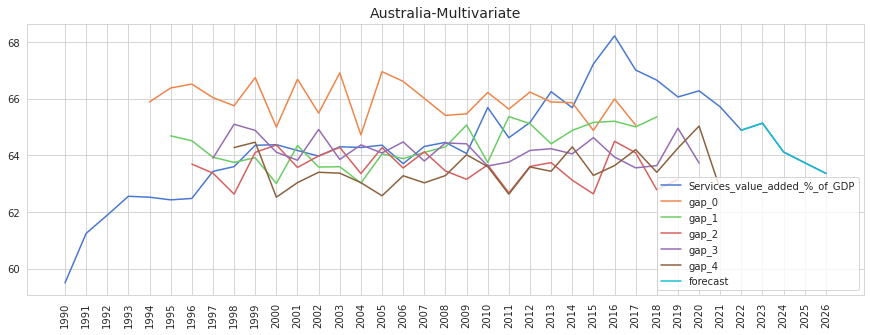

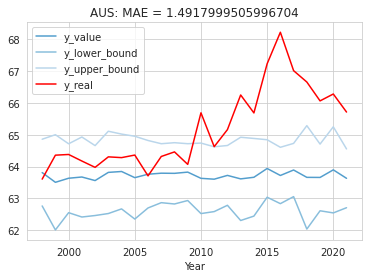

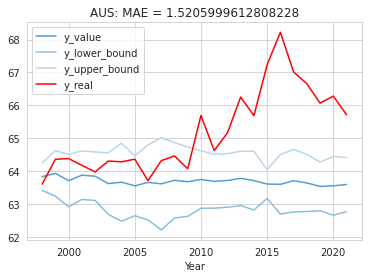

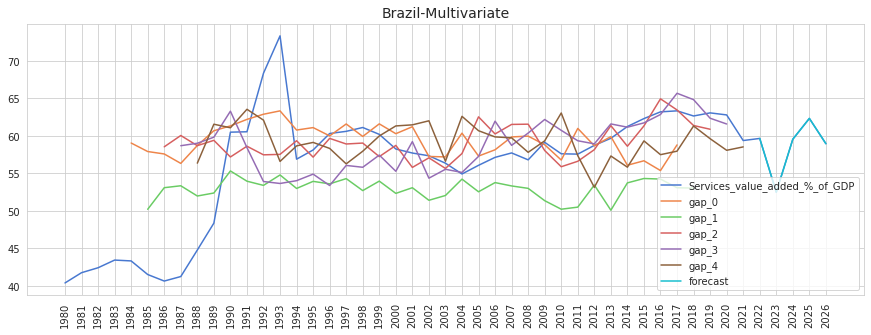

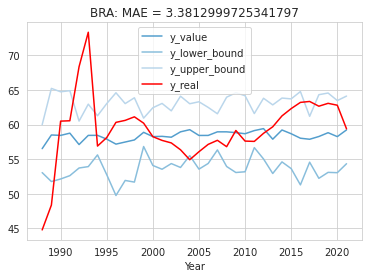

...

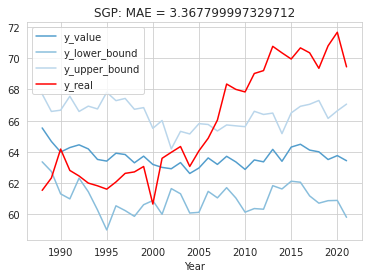

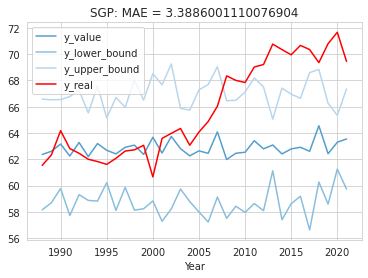

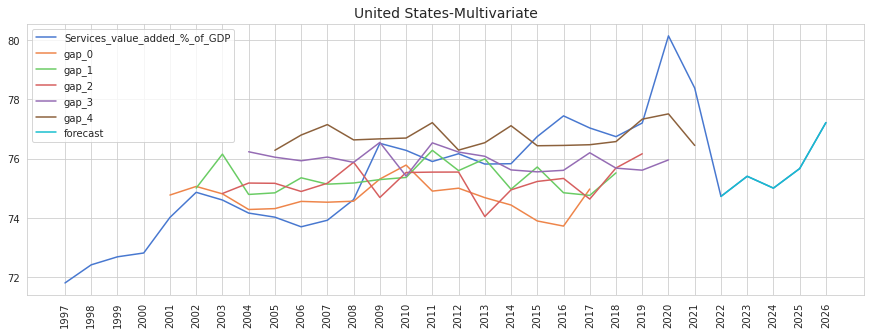

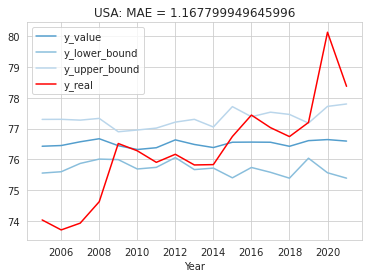

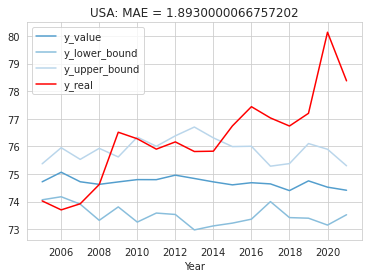

In [127]:
MAEs, RMSEs, MAPEs = [], [], []

for ckey in s_dfs.keys():
  country = dic_country[ckey]
  data = s_dfs[ckey]
  cur_col = list(data.columns)
  scaled_data1 = data.copy()
  scaled_data1['Month'] = 1
  scaled_data1.loc[2021, 'Month'] = 12
  scaled_data1 = scaled_data1[['Month'] + cur_col]
  tmp = scaled_data1.copy().reset_index()
  tmp.index = scaled_data1.index
  pd_year_month = pd.DataFrame(
      {'Year': np.array([[i] * 12 for i in list(data.index)]).reshape(-1),
       'Month':list(range(1, 13)) * len(data)
  })
  scaled_data1 = pd_year_month.merge(scaled_data1,  on = ['Year', 'Month'], how ='left')\
              .interpolate(method="polynomial", order=2)
  rbscaler = MRobustScaler()
  scaled_data1 = rbscaler.transform(scaled_data1, 0.1)
  median, qrange = rbscaler.get_fitted()
  tmp = (tmp  - median.values)/qrange
  train_df, val_df, test_df =train_test_split(tmp, IW = IW + SHIFT)
  wg0 = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                        train_df = train_df, val_df = val_df, test_df = test_df, 
                        scaled_data = tmp,
                        label_columns=[tmp.columns[-1]])
  _all = wg0.make_dataset(tmp.values)
  X = next(iter(_all))[0].numpy()
  if args.gpu: # if gpu
      X =  torch.from_numpy(X).cuda() # convert data to gpu

  _, _, test_df =train_test_split(tmp, IW = IW + SHIFT)
  train_df, val_df, _ =train_test_split(scaled_data1, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data1,
                      label_columns=[data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.8,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 1.3, 
      "prior_pi1": 0.11, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 1.2, 
      "prior_pi2": 0.11, 
      "posterior_rho_init2": 0.3, 
      "prior_sigma_3": 1.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.9, 
      "experiment_name": model_type + '_monthly',
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)

  fcst = forecast(rbscaler, tmp, model, args, IW=IW, name = data.columns[-1])
  fcst['forecast'] = fcst[data.columns[-1]]
  fcst.index = [2022, 2023, 2024, 2025, 2026]
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg0, tmp,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg0, tmp,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

###### Univariate

In [128]:
model_type = 'Univariate'

===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2081, Training Time (s): 0
Epoch [1/8], Val Loss: 0.4530,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.2244, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4610,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2275, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4570,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2475, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4541,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2332, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4183,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.1953, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3574,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2150, Training Time (s): 0
Epoch [7/8], Val Loss: 0.5459,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2145, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4049,  Validation time (s): 0
===== Evaluation =====
MAE [1.5782814, 3.3815238, 2.7852993, 3.5023625, 2.5601208]  Mean MAE 2.7615175 
RMSE [1.8630352, 3.4579718, 2.9018397, 3.5985541, 2.6787071] Mean RMSE 2.9656098 
MAPE [0.02347955, 0.050468367, 0.04155005, 0.052238

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2874, Training Time (s): 0
Epoch [1/8], Val Loss: 0.5367,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3250, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4860,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2234, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5100,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.2519, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4206,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.2160, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4855,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.2236, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5245,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.2569, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4757,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2579, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5212,  Validation time (s): 0
===== Evaluation =====
MAE [2.498684, 3.6982403, 2.5568256, 2.9545753, 3.13214]  Mean MAE 2.968093 
RMSE [2.8605154, 3.80742, 2.65686, 2.9791343, 3.2315972] Mean RMSE 3.132295 
MAPE [0.03725058, 0.055179417, 0.038152855, 0.044102225, 0.0

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3612, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.1607,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3736, Training Time (s): 0
Epoch [2/8], Val Loss: 0.1382,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3588, Training Time (s): 0
Epoch [3/8], Val Loss: 0.1819,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3576, Training Time (s): 0
Epoch [4/8], Val Loss: 0.1806,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3568, Training Time (s): 0
Epoch [5/8], Val Loss: 0.1780,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3483, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1558,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3492, Training Time (s): 0
Epoch [7/8], Val Loss: 0.1389,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3506, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1361,  Validation time (s): 0
===== Evaluation =====
MAE [2.5952244, 5.2153096, 3.5774753, 3.8181884, 4.4142284]  Mean MAE 3.924085 
RMSE [2.7675207, 5.476812, 3.6092513, 4.1155705, 4.6535354] Mean RMSE 4.225509 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3883, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2252,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3873, Training Time (s): 0
Epoch [2/8], Val Loss: 0.1999,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3860, Training Time (s): 0
Epoch [3/8], Val Loss: 0.1814,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3841, Training Time (s): 1
Epoch [4/8], Val Loss: 0.2121,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3783, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2081,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3807, Training Time (s): 0
Epoch [6/8], Val Loss: 0.1754,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3807, Training Time (s): 0
Epoch [7/8], Val Loss: 0.1892,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3703, Training Time (s): 0
Epoch [8/8], Val Loss: 0.1905,  Validation time (s): 0
===== Evaluation =====
MAE [5.074696, 3.398204, 4.2832446, 9.464148, 7.3405304]  Mean MAE 5.9121647 
RMSE [6.086909, 4.255188, 4.8875127, 9.787153, 7.5872326] Mean RMSE 6.817614 
MAP

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.5129, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2832,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.5391, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4240,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5390, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3600,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4865, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3167,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4409, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2941,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4602, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2576,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.6132, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2928,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4221, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3451,  Validation time (s): 0
===== Evaluation =====
MAE [1.1174316, 1.9122124, 2.3014514, 1.4698881, 0.9229291]  Mean MAE 1.5447825 
RMSE [1.3467116, 2.2453558, 2.5629318, 1.607433, 1.3285978] Mean RMSE 1.885358

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4941, Training Time (s): 0
Epoch [1/8], Val Loss: 0.4417,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4647, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2601,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5231, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3309,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4713, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2517,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5351, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3353,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5007, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2396,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4764, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2737,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.5146, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2398,  Validation time (s): 0
===== Evaluation =====
MAE [2.1124413, 1.3108317, 2.1670024, 3.5128345, 0.9890022]  Mean MAE 2.0184224 
RMSE [2.3724923, 1.65659

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4172, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2984,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.4106, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2952,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3833, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3349,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3991, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4038,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.4058, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2996,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3944, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2659,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3735, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3420,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3506, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3028,  Validation time (s): 0
===== Evaluation =====
MAE [6.647898, 16.168245, 15.88709, 6.451363, 13.552032]  Mean MAE 11.741327 
RMSE [6.73918, 16.396225, 16.004847, 7.0006604, 13.635449] Mean RMSE 12.691277 
M

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3588, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3919,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3213, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3548,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3324, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2810,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3224, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3605,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3094, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3028,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3544, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4304,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3303, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3639,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3276, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3718,  Validation time (s): 0
===== Evaluation =====
MAE [3.864329, 9.063062, 10.139373, 10.959716, 15.493661]  Mean MAE 9.904027 
RMSE [4.074276, 9.838354, 10.5410795, 11.05324, 15.651468] Mean RMSE 10.877958 
M

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.6700, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3662,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.6441, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3479,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.6461, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3323,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.6416, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3271,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.6430, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3886,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.6295, Training Time (s): 0
Epoch [6/8], Val Loss: 0.3109,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.6138, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3446,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.6050, Training Time (s): 0
Epoch [8/8], Val Loss: 0.3345,  Validation time (s): 0
===== Evaluation =====
MAE [2.1257389, 1.9116669, 0.22823079, 1.3671557, 1.1991667]  Mean MAE 1.3663918 
RMSE [2.192399, 2.063206, 0.2518028, 1.5666032, 1.4220073] Mean RMSE 1.649435

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([13, 5, 1])) that is different to the input size (torch.Size([65])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.7042, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([7, 5, 1])) that is different to the input size (torch.Size([35])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3261,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.6796, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2824,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.6938, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3074,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.6788, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2634,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.6971, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2119,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.7279, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2660,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.7024, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2789,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.6520, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2771,  Validation time (s): 0
===== Evaluation =====
MAE [0.35016122, 0.2816213, 1.6020342, 1.6079165, 0.63377506]  Mean MAE 0.89510167 
RMSE [0.413144, 0.40564042, 1.694684, 1.7374841, 0.9439526] Mean RMSE 1.193

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.6003, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2652,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.5793, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3320,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.5481, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3584,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5491, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3122,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5435, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3156,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5255, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2995,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.5059, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3064,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4953, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2502,  Validation time (s): 0
===== Evaluation =====
MAE [1.5645695, 6.1889987, 6.619822, 3.4269135, 0.4478264]  Mean MAE 3.6496263 
RMSE [1.882769, 6.3103037, 6.9446907, 3.706868, 0.54639214] Mean RMSE 4.596366 

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.6406, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.2540,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.6144, Training Time (s): 0
Epoch [2/8], Val Loss: 0.2370,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.6247, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2409,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.6149, Training Time (s): 0
Epoch [4/8], Val Loss: 0.2231,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5814, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2590,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.5823, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2362,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.5807, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2244,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.5603, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2300,  Validation time (s): 0
===== Evaluation =====
MAE [2.6320114, 1.3849424, 6.2684693, 0.7277279, 2.9562461]  Mean MAE 2.7938793 
RMSE [2.686528, 1.5937145, 6.279139, 0.8854727, 3.2849803] Mean RMSE 3.4859746

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3485, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3857,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3478, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4911,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3484, Training Time (s): 0
Epoch [3/8], Val Loss: 0.5380,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3228, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4201,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3396, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4528,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3310, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5371,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3535, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4560,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3151, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5512,  Validation time (s): 0
===== Evaluation =====
MAE [0.8089307, 0.766524, 2.2856483, 1.9406878, 0.87785596]  Mean MAE 1.3359294 
RMSE [0.9605952, 1.0981252, 2.4814992, 1.9675509, 0.89785695] Mean RMSE 1.6102089 
MAPE [0.011379561, 0.010836081, 0.032641433, 0.027

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([10, 5, 1])) that is different to the input size (torch.Size([50])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3316, Training Time (s): 0
Epoch [1/8], Val Loss: 0.3868,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([6, 5, 1])) that is different to the input size (torch.Size([30])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.3212, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3842,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.2968, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3930,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3459, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3781,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3219, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3456,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3112, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4234,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3736, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3927,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3703, Training Time (s): 0
Epoch [8/8], Val Loss: 0.4048,  Validation time (s): 0
===== Evaluation =====
MAE [2.4606717, 0.6991183, 1.797788, 0.47504172, 0.80170184]  Mean MAE 1.2468643 
RMSE [2.5084064, 0.9579926, 2.085293, 0.5256559, 0.97177315] Mean RMSE 1.5986843 
MAPE [0.034792326, 0.009884541, 0.02583433, 0.0068

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.0562195, MAE2: 0.9113617
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.3426, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.3984,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3393, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4189,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3074, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4523,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3508, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4145,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3121, Training Time (s): 0
Epoch [5/8], Val Loss: 0.4080,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3163, Training Time (s): 0
Epoch [6/8], Val Loss: 0.4189,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3156, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4755,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.2660, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5353,  Validation time (s): 0
===== Evaluation =====
MAE [6.340975, 6.412819, 5.802826, 5.953608, 4.1281]  Mean MAE 5.7276654 
RMSE [6.3951535, 6.481819, 5.810428, 5.9750743, 4.2983627] Mean RMSE 5.845519 
MAPE [

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([21, 5, 1])) that is different to the input size (torch.Size([105])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.2640, Training Time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([9, 5, 1])) that is different to the input size (torch.Size([45])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Val Loss: 0.5379,  Validation time (s): 0
Epoch [2/8], Train Loss: 0.3282, Training Time (s): 0
Epoch [2/8], Val Loss: 0.4738,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.3147, Training Time (s): 0
Epoch [3/8], Val Loss: 0.4840,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.3129, Training Time (s): 0
Epoch [4/8], Val Loss: 0.4566,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.3047, Training Time (s): 0
Epoch [5/8], Val Loss: 0.5253,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.3271, Training Time (s): 0
Epoch [6/8], Val Loss: 0.5352,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.3244, Training Time (s): 0
Epoch [7/8], Val Loss: 0.4904,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.3310, Training Time (s): 0
Epoch [8/8], Val Loss: 0.5523,  Validation time (s): 0
===== Evaluation =====
MAE [6.23777, 3.1944478, 8.228161, 6.26664, 3.3164647]  Mean MAE 5.448697 
RMSE [6.3074718, 3.3369088, 8.3243685, 6.2862263, 3.6843314] Mean RMSE 5.8873625 
MA

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 3.1368794, MAE2: 3.0575955
===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4721, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2717,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.4672, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3337,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4245, Training Time (s): 0
Epoch [3/8], Val Loss: 0.2158,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.5306, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3101,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5573, Training Time (s): 0
Epoch [5/8], Val Loss: 0.3092,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.6497, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2445,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.5180, Training Time (s): 0
Epoch [7/8], Val Loss: 0.2295,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4820, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2067,  Validation time (s): 0
===== Evaluation =====
MAE [0.5248744, 0.49452338, 1.423369, 0.7400411, 0.9871063]  Mean MAE 0.8339828 
RMSE [0.59265935, 0.5959843, 1.5098158, 1.2673477, 1.0676236] Mean RMSE 1.0706984 
MAPE [0.0068766023, 0.006474406, 0.01848376, 0.009

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


===== Training =====


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([8, 5, 1])) that is different to the input size (torch.Size([40])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [1/8], Train Loss: 0.4990, Training Time (s): 0
Epoch [1/8], Val Loss: 0.2993,  Validation time (s): 0


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5, 5, 1])) that is different to the input size (torch.Size([25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [2/8], Train Loss: 0.5207, Training Time (s): 0
Epoch [2/8], Val Loss: 0.3847,  Validation time (s): 0
Epoch [3/8], Train Loss: 0.4423, Training Time (s): 0
Epoch [3/8], Val Loss: 0.3358,  Validation time (s): 0
Epoch [4/8], Train Loss: 0.4772, Training Time (s): 0
Epoch [4/8], Val Loss: 0.3498,  Validation time (s): 0
Epoch [5/8], Train Loss: 0.5380, Training Time (s): 0
Epoch [5/8], Val Loss: 0.2118,  Validation time (s): 0
Epoch [6/8], Train Loss: 0.4794, Training Time (s): 0
Epoch [6/8], Val Loss: 0.2628,  Validation time (s): 0
Epoch [7/8], Train Loss: 0.4628, Training Time (s): 0
Epoch [7/8], Val Loss: 0.3635,  Validation time (s): 0
Epoch [8/8], Train Loss: 0.4629, Training Time (s): 0
Epoch [8/8], Val Loss: 0.2429,  Validation time (s): 0
===== Evaluation =====
MAE [1.5685717, 0.91373825, 2.3301723, 0.8092105, 1.5056305]  Mean MAE 1.4254646 
RMSE [1.7022976, 0.9891458, 2.4587004, 1.2534492, 1.881034] Mean RMSE 1.7338315 
MAPE [0.020438092, 0.011899578, 0.030272404, 0.0102

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


MAE1: 1.1770899, MAE2: 1.2787565


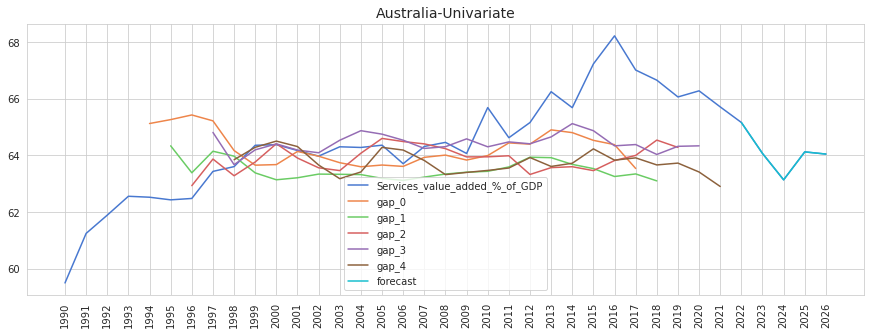

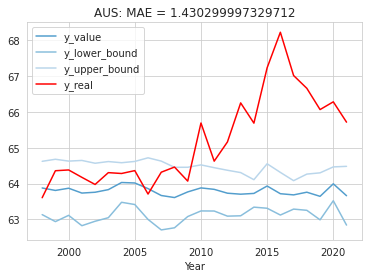

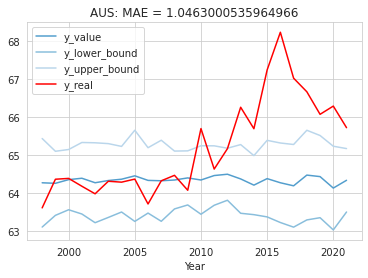

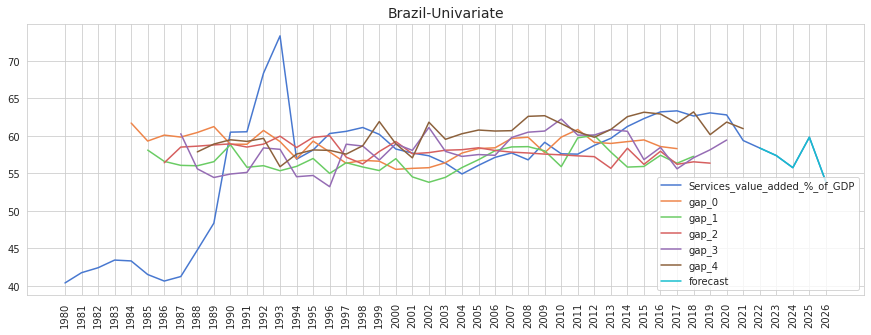

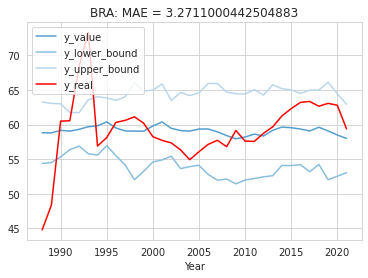

...

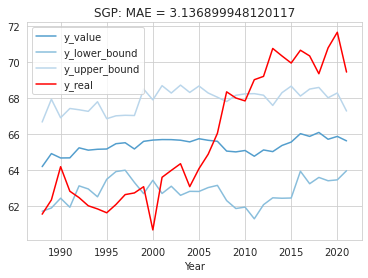

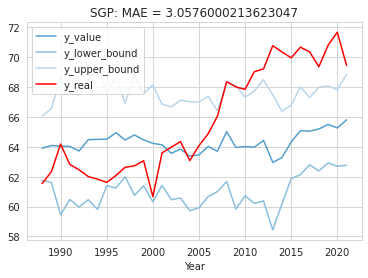

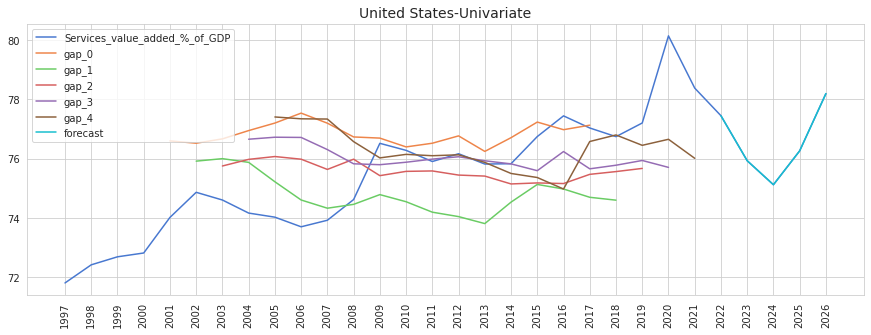

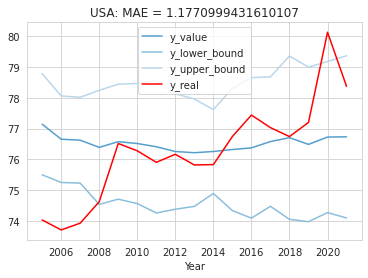

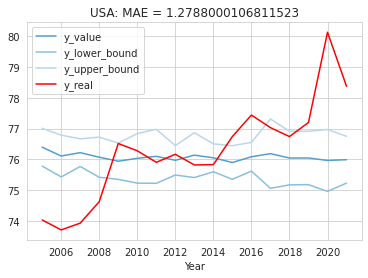

In [129]:
for ckey in s_dfs.keys():
  country = dic_country[ckey]
  data = s_dfs[ckey]
  data = data[['Services_value_added_%_of_GDP']]
  cur_col = list(data.columns)
  scaled_data1 = data.copy()
  scaled_data1['Month'] = 1
  scaled_data1.loc[2021, 'Month'] = 12
  scaled_data1 = scaled_data1[['Month'] + cur_col]
  tmp = scaled_data1.copy().reset_index()
  tmp.index = scaled_data1.index
  pd_year_month = pd.DataFrame(
      {'Year': np.array([[i] * 12 for i in list(data.index)]).reshape(-1),
       'Month':list(range(1, 13)) * len(data)
  })
  scaled_data1 = pd_year_month.merge(scaled_data1,  on = ['Year', 'Month'], how ='left')\
              .interpolate(method="polynomial", order=2)
  rbscaler = MRobustScaler()
  scaled_data1 = rbscaler.transform(scaled_data1, 0.1)
  median, qrange = rbscaler.get_fitted()
  tmp = (tmp  - median.values)/qrange
  train_df, val_df, test_df =train_test_split(tmp, IW = IW + SHIFT)
  wg0 = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                        train_df = train_df, val_df = val_df, test_df = test_df, 
                        scaled_data = tmp,
                        label_columns=[tmp.columns[-1]])
  _all = wg0.make_dataset(tmp.values)
  X = next(iter(_all))[0].numpy()
  if args.gpu: # if gpu
      X =  torch.from_numpy(X).cuda() # convert data to gpu

  _, _, test_df =train_test_split(tmp, IW = IW + SHIFT)
  train_df, val_df, _ =train_test_split(scaled_data1, IW = IW + SHIFT)
  # use 4 year to predict 1 year ahead
  wg = WindowGenerator(input_width=IW, label_width=LW, shift=SHIFT,
                      train_df = train_df, val_df = val_df, test_df = test_df, 
                      scaled_data = scaled_data1,
                      label_columns=[data.columns[-1]])
  args = AttrDict()
  args_dict = {
      "gpu": True,
      "checkpoint_name": "BayesLSTM",
      "learn_rate": 0.0005,
      "batch_size": 8,
      "n_features": wg.train_df.shape[1],
      "output_length": LW, # label width
      "stacked_layers": 12,
      "hidden_size_1": 256,
      "hidden_size_2": 128,
      "num_layers": 10,
      "dropout_probability": 0.7,
      "epochs": 8,
      "loss": 'L1Loss',
      "plot": True,
      "prior_sigma_1": 2.3, 
      "prior_pi1": 0.71, 
      "posterior_rho_init1": 0.5, 
      "prior_sigma_2": 2.2, 
      "prior_pi2": 0.21, 
      "posterior_rho_init2": 0.4, 
      "prior_sigma_3": 2.3, 
      "prior_pi3": 0.61, 
      "posterior_rho_init3": 0.4, 
      "experiment_name": model_type + '_monthly',
      "full_model": False
  }
  args.update(args_dict)
  # Clear the cache in GPU
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)

  fcst = forecast(rbscaler, tmp, model, args, IW=IW, name = data.columns[-1])
  fcst['forecast'] = fcst[data.columns[-1]]
  fcst.index = [2022, 2023, 2024, 2025, 2026]
  df = pd.concat(
    [pd.concat([data.iloc[:, -1], pat_pred(y_pred1, data)], axis = 1),
    fcst
    ]
  )
  fig = plt.figure(figsize = (15, 5))
  ax = fig.add_subplot(1, 1, 1)
  ax = df.plot(color = cmap, ax=ax)
  plt.title(f'{country}-{model_type}', fontsize=14)
  plt.xticks(rotation=90)
  t = ax.set_xticks(list(df.index))
  ax.get_figure().savefig(path_LSTM + args.experiment_name  + f'/output/{target_type}/{country}-{model_type}', bbox_inches='tight')

  df_1, df_2, mae1, rmse1, mape1 = fetch_all(model, wg0, tmp,args=args, samples=10)
  args_dict['full_model'] = True
  args.update(args_dict)
  torch.cuda.empty_cache()
  model = NN(args)
  y_pred, y_real, y_pred1, y_real1 = train(wg0, args, model, rbscaler)
  df_3, df_4, mae2, rmse2, mape2 = fetch_all(model, wg0, tmp,args=args, samples=10)
  write_data()
  print(f'MAE1: {mae1}, MAE2: {mae2}')
  MAEs.append(mae2)
  RMSEs.append(rmse2)
  MAPEs.append(mape2)

In [131]:
rst = pd.DataFrame({
  'Country': [dic_country[c] for c in s_dfs.keys()]*2,
  'Type': ['Multivariate'] * 9 + ['Univariate'] * 9,
  'MAE': MAEs,
  'RMSE': RMSEs,
  'MAPE':MAPEs
              }).sort_values('Country').set_index('Country')
rst.to_csv(path_LSTM + f'{target_type}_monthly_result.csv')

rst

,Type,MAE,RMSE,MAPE
Country,,,,
Australia,Multivariate,1.5206116,1.9704415,0.025209745
Australia,Univariate,1.0463036,1.5133653,0.01673523
Brazil,Multivariate,6.6016684,7.5990868,0.099647164
Brazil,Univariate,4.1842365,5.5636244,0.10800844
Canada,Multivariate,2.5478628,2.9143257,0.028067099
Canada,Univariate,1.5165569,1.8557267,0.028542556
China,Multivariate,6.7853827,8.169294,0.1544621
China,Univariate,6.3361306,7.5437856,0.18989697
India,Multivariate,3.5610158,3.8974664,0.09449082
